# FaceForensics++ Deepfake Detection
**Paper:** Rossler et al., "FaceForensics++: Learning to Detect Manipulated Facial Images" (arXiv 1901.08971)



---
## Phase 0 — Environment Setup

In [ ]:
# ── 0.1  Check GPU ────────────────────────────────────────────────────────────
import subprocess
result = subprocess.run(['nvidia-smi'], capture_output=True, text=True)
print(result.stdout if result.returncode == 0 else ' No GPU found – switch runtime to GPU!')

Wed Apr 15 16:00:52 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   51C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
# ── 0.2  Install all dependencies ────────────────────────────────────────────
!pip install -q \
    torch torchvision torchaudio \
    facenet-pytorch \
    opencv-python-headless \
    albumentations \
    timm \
    scikit-learn \
    matplotlib seaborn tqdm \
    torchcam mediapipe scipy

print('All dependencies installed.')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 40.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.4/11.4 MB 53.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 10.4 MB/s eta 0:00:00
All dependencies installed.


In [ ]:
# ── 0.3  Imports ──────────────────────────────────────────────────────────────
import os, sys, json, random, time, shutil, warnings, io
from pathlib import Path
from tqdm import tqdm
from copy import deepcopy

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

import timm
from facenet_pytorch import MTCNN
from sklearn.metrics import (
    accuracy_score, classification_report,
    confusion_matrix, roc_auc_score, roc_curve,
    f1_score, precision_score, recall_score
)
from sklearn.metrics import auc as sklearn_auc

warnings.filterwarnings('ignore')

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device : {DEVICE}')

Device : cuda


In [ ]:
# ── 0.4  Global config ────────────────────────────────────────────────────────
class CFG:
    # Paths
    ROOT             = Path('/content/ff_data')
    FACES_DIR        = Path('/content/ff_faces')
    CKPT_DIR         = Path('/content/checkpoints')
    LOG_DIR          = Path('/content/logs')

    # Download
    SCRIPT_URL       = 'https://kaldir.vc.in.tum.de/faceforensics_download_v4.py'
    SCRIPT_PATH      = '/content/download_FF.py'
    SERVER           = 'EU2'
    COMPRESSION      = 'c40'
    NUM_REAL_VIDEOS  = 200
    NUM_FAKE_VIDEOS  = 50
    FAKE_METHODS     = ['Deepfakes', 'Face2Face', 'FaceSwap', 'NeuralTextures']

    # Face extraction
    FACE_SIZE        = 224
    MARGIN           = 30
    FRAMES_PER_VIDEO = 10

    # Training
    MODEL_NAME   = 'xception'
    EPOCHS       = 10
    BATCH_SIZE   = 16
    LR           = 1e-4
    WEIGHT_DECAY = 1e-5
    TRAIN_SPLIT  = 0.8
    VAL_SPLIT    = 0.1

for d in [CFG.ROOT, CFG.FACES_DIR, CFG.CKPT_DIR, CFG.LOG_DIR]:
    d.mkdir(parents=True, exist_ok=True)
print('Directories ready.')
print(f'    Fake methods : {CFG.FAKE_METHODS}')
print(f'    Compression  : {CFG.COMPRESSION}')

Directories ready.
    Fake methods : ['Deepfakes', 'Face2Face', 'FaceSwap', 'NeuralTextures']
    Compression  : c40


---
## Phase 1 — Dataset Construction
> FF++ contains 1,000 pristine YouTube videos manipulated by 4 methods at 3 compression levels.
> We use c40 (low quality) subset for Colab efficiency. Face crops extracted via MTCNN as in no.4 pipeline.

In [ ]:
# ── 1.1  Download FF++ script ─────────────────────────────────────────────────
import urllib.request
print(f'Fetching: {CFG.SCRIPT_URL}')
urllib.request.urlretrieve(CFG.SCRIPT_URL, CFG.SCRIPT_PATH)
print(f'Script saved → {CFG.SCRIPT_PATH}  ({os.path.getsize(CFG.SCRIPT_PATH)} bytes)')

Fetching: https://kaldir.vc.in.tum.de/faceforensics_download_v4.py
Script saved → /content/download_FF.py  (10727 bytes)


In [ ]:
# ── 1.2  Inspect download arguments ─────────────────────────────────────────
!python {CFG.SCRIPT_PATH} --help

usage: download_FF.py [-h]
                      [-d {original_youtube_videos,original_youtube_videos_info,original,DeepFakeDetection_original,Deepfakes,DeepFakeDetection,Face2Face,FaceShifter,FaceSwap,NeuralTextures,all}]
                      [-c {raw,c23,c40}] [-t {videos,masks,models}]
                      [-n NUM_VIDEOS] [--server {EU,EU2,CA}]
                      output_path

Downloads FaceForensics v2 public data release.

positional arguments:
  output_path           Output directory.

options:
  -h, --help            show this help message and exit
  -d {original_youtube_videos,original_youtube_videos_info,original,DeepFakeDetection_original,Deepfakes,DeepFakeDetection,Face2Face,FaceShifter,FaceSwap,NeuralTextures,all}, --dataset {original_youtube_videos,original_youtube_videos_info,original,DeepFakeDetection_original,Deepfakes,DeepFakeDetection,Face2Face,FaceShifter,FaceSwap,NeuralTextures,all}
                        Which dataset to download, either pristine or
          

In [ ]:
# ── 1.3  Download datasets (original + all 4 fake methods) ───────────────────
for dataset in ['original'] + CFG.FAKE_METHODS:
    n = CFG.NUM_REAL_VIDEOS if dataset == 'original' else CFG.NUM_FAKE_VIDEOS
    print(f'\n━━━ Downloading: {dataset}  (n={n}) ━━━')
    cmd = (f'echo "" | python {CFG.SCRIPT_PATH} {str(CFG.ROOT)} '
           f'-d {dataset} -c {CFG.COMPRESSION} -t videos '
           f'-n {n} --server {CFG.SERVER}')
    os.system(cmd)


━━━ Downloading: original  (n=200) ━━━

━━━ Downloading: Deepfakes  (n=50) ━━━

━━━ Downloading: Face2Face  (n=50) ━━━

━━━ Downloading: FaceSwap  (n=50) ━━━

━━━ Downloading: NeuralTextures  (n=50) ━━━


In [ ]:
# ── 1.4  Dataset summary ──────────────────────────────────────────────────────
def count_mp4(path):
    p = Path(path)
    return len(list(p.glob('*.mp4'))) if p.exists() else 0

print('Dataset summary:')
real_path = CFG.ROOT / 'original_sequences' / 'youtube' / CFG.COMPRESSION / 'videos'
n_real = count_mp4(real_path)
print(f'    {"original (real)":25s}: {n_real} videos')
total_fake = 0
for method in CFG.FAKE_METHODS:
    fake_path = CFG.ROOT / 'manipulated_sequences' / method / CFG.COMPRESSION / 'videos'
    n = count_mp4(fake_path)
    total_fake += n
    print(f'    {method:25s}: {n} videos')
print(f'\n    Total real  : {n_real}')
print(f'    Total fake  : {total_fake}')

Dataset summary:
    original (real)          : 200 videos
    Deepfakes                : 50 videos
    Face2Face                : 50 videos
    FaceSwap                 : 50 videos
    NeuralTextures           : 50 videos

    Total real  : 200
    Total fake  : 200


In [ ]:
# ── 1.5  Disk usage check ─────────────────────────────────────────────────────
!du -sh {CFG.ROOT}
!df -h /content | tail -1

91M	/content/ff_data
overlay         113G   44G   70G  39% /


In [ ]:
# ── 1.6  Init MTCNN face detector ──
face_detector = MTCNN(
    image_size=CFG.FACE_SIZE, margin=CFG.MARGIN,
    keep_all=False, device=DEVICE, post_process=False
)
print('MTCNN initialised.')

MTCNN initialised.


In [ ]:
# ── 1.7  Per-video face extraction function ───────────────────────────────────
def extract_faces_from_video(video_path, out_dir, frames_per_video=10, face_size=224):

    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)
    cap = cv2.VideoCapture(str(video_path))
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    if total == 0:
        cap.release(); return 0
    indices = np.linspace(0, total - 1, frames_per_video, dtype=int)
    saved = 0
    for idx in indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, int(idx))
        ret, frame = cap.read()
        if not ret: continue
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        try:
            face = face_detector(frame_rgb)
        except Exception:
            face = None
        if face is None:
            face_img = cv2.resize(frame_rgb, (face_size, face_size))
        else:
            face_img = face.permute(1, 2, 0).numpy().astype(np.uint8)
        out_path = out_dir / f'frame_{idx:05d}.jpg'
        cv2.imwrite(str(out_path), cv2.cvtColor(face_img, cv2.COLOR_RGB2BGR))
        saved += 1
    cap.release()
    return saved

print('Extraction function defined.')

Extraction function defined.


In [ ]:
# ── 1.8  Build face crop dataset ──────────────────────────────────────────────
def build_face_dataset(cfg):
    real_video_dir = cfg.ROOT/'original_sequences'/'youtube'/cfg.COMPRESSION/'videos'
    real_videos = sorted(real_video_dir.glob('*.mp4'))[:cfg.NUM_REAL_VIDEOS]
    print(f'[REAL]  {len(real_videos)} videos → extracting faces...')
    for vp in tqdm(real_videos, desc='  Real'):
        out = cfg.FACES_DIR/'real'/vp.stem
        if not out.exists():
            extract_faces_from_video(vp, out, cfg.FRAMES_PER_VIDEO, cfg.FACE_SIZE)
    for method in cfg.FAKE_METHODS:
        fake_video_dir = cfg.ROOT/'manipulated_sequences'/method/cfg.COMPRESSION/'videos'
        fake_videos = sorted(fake_video_dir.glob('*.mp4'))[:cfg.NUM_FAKE_VIDEOS]
        print(f'[{method}]  {len(fake_videos)} videos → extracting faces...')
        for vp in tqdm(fake_videos, desc=f'  {method}'):
            out = cfg.FACES_DIR/method/vp.stem
            if not out.exists():
                extract_faces_from_video(vp, out, cfg.FRAMES_PER_VIDEO, cfg.FACE_SIZE)
    print('\nFace extraction complete!')

build_face_dataset(CFG)

[REAL]  200 videos → extracting faces...


  Real: 100%|██████████| 200/200 [08:30<00:00,  2.55s/it]


[Deepfakes]  50 videos → extracting faces...


  Deepfakes: 100%|██████████| 50/50 [02:06<00:00,  2.53s/it]


[Face2Face]  50 videos → extracting faces...


  Face2Face: 100%|██████████| 50/50 [02:02<00:00,  2.45s/it]


[FaceSwap]  50 videos → extracting faces...


  FaceSwap: 100%|██████████| 50/50 [02:01<00:00,  2.43s/it]


[NeuralTextures]  50 videos → extracting faces...


  NeuralTextures: 100%|██████████| 50/50 [02:02<00:00,  2.44s/it]


Face extraction complete!


In [ ]:
# ── 1.9  Face crop counts ─────────────────────────────────────────────────────
print('Extracted face crops:')
for cls in ['real'] + CFG.FAKE_METHODS:
    n = len(list((CFG.FACES_DIR / cls).rglob('*.jpg')))
    print(f'    {cls:25s}: {n} images')

Extracted face crops:
    real                     : 2000 images
    Deepfakes                : 500 images
    Face2Face                : 500 images
    FaceSwap                 : 500 images
    NeuralTextures           : 500 images


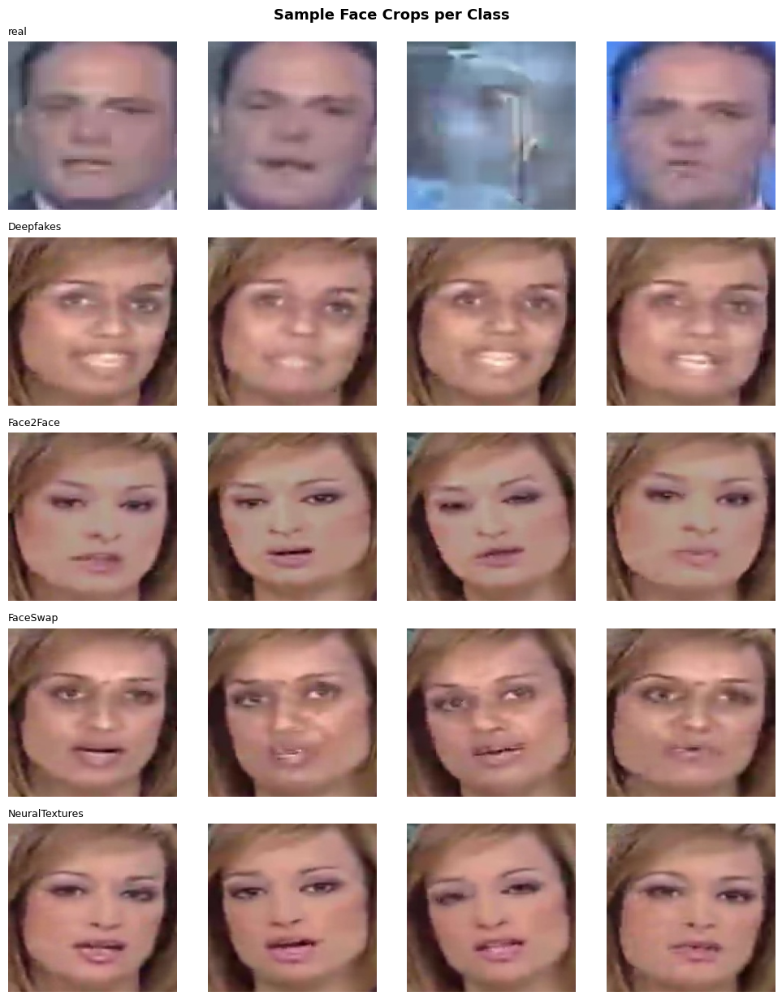

In [ ]:
# ── 1.10  Visualise sample crops ─────────────────────────────────────────────
classes = ['real'] + CFG.FAKE_METHODS
n_show  = 4
fig, axes = plt.subplots(len(classes), n_show, figsize=(n_show*2.5, len(classes)*2.5))
fig.suptitle('Sample Face Crops per Class', fontsize=13, fontweight='bold')
for row, cls in enumerate(classes):
    imgs = list((CFG.FACES_DIR/cls).rglob('*.jpg'))[:n_show]
    for col in range(n_show):
        ax = axes[row][col]; ax.axis('off')
        if col == 0: ax.set_title(cls, fontsize=9, loc='left')
        if col < len(imgs):
            img = cv2.cvtColor(cv2.imread(str(imgs[col])), cv2.COLOR_BGR2RGB)
            ax.imshow(img)
plt.tight_layout()
plt.savefig('/content/sample_faces.png', dpi=120, bbox_inches='tight')
plt.show()

In [ ]:
# ── 1.11  Collect samples + train/val/test split ─────────────────────────────
def collect_samples(faces_dir, fake_methods):
    faces_dir = Path(faces_dir)
    samples = []
    for p in (faces_dir/'real').rglob('*.jpg'):
        samples.append((str(p), 0))
    for method in fake_methods:
        for p in (faces_dir/method).rglob('*.jpg'):
            samples.append((str(p), 1))
    random.shuffle(samples)
    return samples

samples = collect_samples(CFG.FACES_DIR, CFG.FAKE_METHODS)
n       = len(samples)
n_train = int(n * CFG.TRAIN_SPLIT)
n_val   = int(n * CFG.VAL_SPLIT)
train_samples = samples[:n_train]
val_samples   = samples[n_train:n_train+n_val]
test_samples  = samples[n_train+n_val:]

n_real = sum(1 for _,l in samples if l==0)
n_fake = n - n_real
print(f'Total  : {n:,}   Real: {n_real:,}   Fake: {n_fake:,}')
print(f'Train  : {len(train_samples):,}')
print(f'Val    : {len(val_samples):,}')
print(f'Test   : {len(test_samples):,}')

Total  : 4,000   Real: 2,000   Fake: 2,000
Train  : 3,200
Val    : 400
Test   : 400


---
## Phase 2 — Baseline: XceptionNet RGB-only
> Faithful implementation of the paper's primary model .
> Input: 3-channel RGB face crops → XceptionNet pretrained on ImageNet → binary classifier.

In [ ]:
# ── 2.1  Baseline transforms (matches paper augmentation) ────────────────────
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

baseline_train_tf = T.Compose([
    T.ToPILImage(),
    T.Resize((CFG.FACE_SIZE, CFG.FACE_SIZE)),
    T.RandomHorizontalFlip(p=0.5),
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    T.RandomRotation(degrees=10),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])
baseline_eval_tf = T.Compose([
    T.ToPILImage(),
    T.Resize((CFG.FACE_SIZE, CFG.FACE_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])
print('Baseline transforms ready.')

Baseline transforms ready.


In [ ]:
# ── 2.2  Baseline dataset class ──────────────────────────────────────────────
class BaselineDataset(Dataset):
    def __init__(self, samples, transform=None):
        self.samples   = samples
        self.transform = transform
    def __len__(self): return len(self.samples)
    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        img = cv2.imread(img_path)
        if img is None:
            img = np.zeros((CFG.FACE_SIZE, CFG.FACE_SIZE, 3), dtype=np.uint8)
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if self.transform: img = self.transform(img)
        return img, torch.tensor(label, dtype=torch.long)

baseline_train_ds = BaselineDataset(train_samples, baseline_train_tf)
baseline_val_ds   = BaselineDataset(val_samples,   baseline_eval_tf)
baseline_test_ds  = BaselineDataset(test_samples,  baseline_eval_tf)
baseline_train_loader = DataLoader(baseline_train_ds, batch_size=CFG.BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
baseline_val_loader   = DataLoader(baseline_val_ds,   batch_size=CFG.BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
baseline_test_loader  = DataLoader(baseline_test_ds,  batch_size=CFG.BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
print(f'Baseline DataLoaders — {len(baseline_train_loader)} train batches')


Baseline DataLoaders — 200 train batches


In [ ]:
# ── 2.3  Build baseline XceptionNet ────────────────────
baseline_model = timm.create_model('xception', pretrained=True, num_classes=2).to(DEVICE)
total_b     = sum(p.numel() for p in baseline_model.parameters())
trainable_b = sum(p.numel() for p in baseline_model.parameters() if p.requires_grad)
print(f'XceptionNet (3-ch RGB)  |  Total: {total_b:,}  Trainable: {trainable_b:,}')

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-cadene/xception-43020ad28.pth" to /root/.cache/torch/hub/checkpoints/xception-43020ad28.pth
XceptionNet (3-ch RGB)  |  Total: 20,811,050  Trainable: 20,811,050


In [ ]:
# ── 2.4  Shared training utilities ───────────────────────────────────────────
def train_epoch(model, loader, criterion, optimizer):
    model.train()
    total_loss, correct, total = 0.0, 0, 0
    for x, labels in tqdm(loader, desc='  Train', leave=False):
        x, labels = x.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        out  = model(x)
        loss = criterion(out, labels)
        loss.backward(); optimizer.step()
        total_loss += loss.item() * x.size(0)
        correct    += (out.argmax(1) == labels).sum().item()
        total      += labels.size(0)
    return total_loss / total, correct / total

@torch.no_grad()
def eval_epoch(model, loader, criterion):
    model.eval()
    total_loss, correct, total = 0.0, 0, 0
    all_probs, all_labels = [], []
    for x, labels in tqdm(loader, desc='  Eval ', leave=False):
        x, labels = x.to(DEVICE), labels.to(DEVICE)
        out  = model(x)
        loss = criterion(out, labels)
        total_loss += loss.item() * x.size(0)
        probs = torch.softmax(out, dim=1)[:, 1]
        correct += (out.argmax(1) == labels).sum().item()
        total   += labels.size(0)
        all_probs.extend(probs.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
    auc = roc_auc_score(all_labels, all_probs) if len(set(all_labels)) > 1 else 0.0
    return total_loss / total, correct / total, auc

@torch.no_grad()
def full_evaluate(model, loader):
    model.eval()
    all_preds, all_probs, all_labels = [], [], []
    for x, labels in tqdm(loader, desc='  Test '):
        x = x.to(DEVICE)
        out   = model(x)
        probs = torch.softmax(out, dim=1)[:, 1].cpu().numpy()
        preds = out.argmax(dim=1).cpu().numpy()
        all_probs.extend(probs); all_preds.extend(preds); all_labels.extend(labels.numpy())
    return np.array(all_labels), np.array(all_preds), np.array(all_probs)

def run_training(model, train_loader, val_loader, ckpt_path, tag=''):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=CFG.LR, weight_decay=CFG.WEIGHT_DECAY)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CFG.EPOCHS, eta_min=1e-6)
    history   = {'train_loss':[], 'train_acc':[], 'val_loss':[], 'val_acc':[], 'val_auc':[]}
    best_val_acc = 0.0
    for epoch in range(1, CFG.EPOCHS + 1):
        t0 = time.time()
        tr_loss, tr_acc          = train_epoch(model, train_loader, criterion, optimizer)
        vl_loss, vl_acc, vl_auc = eval_epoch(model, val_loader, criterion)
        scheduler.step()
        history['train_loss'].append(tr_loss); history['train_acc'].append(tr_acc)
        history['val_loss'].append(vl_loss);   history['val_acc'].append(vl_acc)
        history['val_auc'].append(vl_auc)
        print(f'[{tag}] Epoch [{epoch:02d}/{CFG.EPOCHS}]  '
              f'Train {tr_loss:.4f}/{tr_acc:.4f}  '
              f'Val {vl_loss:.4f}/{vl_acc:.4f}  AUC {vl_auc:.4f}  ({time.time()-t0:.1f}s)')
        if vl_acc > best_val_acc:
            best_val_acc = vl_acc
            torch.save({'epoch': epoch, 'model_state': model.state_dict(),
                        'val_acc': vl_acc, 'val_auc': vl_auc}, ckpt_path)
            print(f'Saved  (val_acc={vl_acc:.4f})')
    print(f' [{tag}] Done. Best val_acc={best_val_acc:.4f}')
    return history

print('Training utilities ready.')

Training utilities ready.


In [ ]:
# ── 2.5  Train baseline model ─────────────────────────────────────────────────
print('='*60)
print(' BASELINE TRAINING  (RGB XceptionNet — Paper §4.2)')
print('='*60)
baseline_ckpt    = CFG.CKPT_DIR / 'baseline_best.pth'
baseline_history = run_training(baseline_model, baseline_train_loader,
                                 baseline_val_loader, baseline_ckpt, tag='BASELINE')

 BASELINE TRAINING  (RGB XceptionNet — Paper §4.2)


[BASELINE] Epoch [01/10]  Train 0.5504/0.7056  Val 0.4156/0.8175  AUC 0.8929  (63.0s)
Saved  (val_acc=0.8175)


[BASELINE] Epoch [02/10]  Train 0.3396/0.8516  Val 0.2829/0.8850  AUC 0.9525  (68.9s)
Saved  (val_acc=0.8850)


[BASELINE] Epoch [03/10]  Train 0.2424/0.9072  Val 0.2766/0.8900  AUC 0.9735  (69.6s)
Saved  (val_acc=0.8900)


[BASELINE] Epoch [04/10]  Train 0.1909/0.9213  Val 0.1773/0.9350  AUC 0.9827  (70.3s)
Saved  (val_acc=0.9350)


[BASELINE] Epoch [05/10]  Train 0.1456/0.9472  Val 0.1512/0.9425  AUC 0.9868  (70.1s)
Saved  (val_acc=0.9425)


[BASELINE] Epoch [06/10]  Train 0.1016/0.9659  Val 0.1700/0.9375  AUC 0.9824  (70.0s)


[BASELINE] Epoch [07/10]  Train 0.0815/0.9709  Val 0.1444/0.9375  AUC 0.9879  (69.8s)


[BASELINE] Epoch [08/10]  Train 0.0719/0.9709  Val 0.1372/0.9500  AUC 0.9890  (70.0s)
Saved  (val_acc=0.9500)


[BASELINE] Epoch [09/10]  Train 0.0520/0.9834  Val 0.1338/0.9375  AUC 0.9891  (70.6s)


[BASELINE] Epoch [10/10]  Train 0.0510/0.9831  Val 0.1351/0.9425  AUC 0.9892  (69.7s)
 [BASELINE] Done. Best val_acc=0.9500


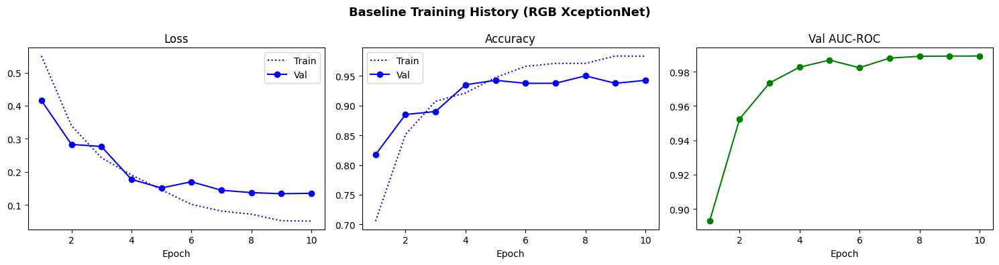

In [ ]:
# ── 2.6  Baseline training curves ────────────────────────────────────────────
epochs = range(1, CFG.EPOCHS + 1)
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
fig.suptitle('Baseline Training History (RGB XceptionNet)', fontsize=13, fontweight='bold')
axes[0].plot(epochs, baseline_history['train_loss'], 'b:',  label='Train')
axes[0].plot(epochs, baseline_history['val_loss'],   'b-o', label='Val')
axes[0].set_title('Loss'); axes[0].legend(); axes[0].set_xlabel('Epoch')
axes[1].plot(epochs, baseline_history['train_acc'], 'b:',  label='Train')
axes[1].plot(epochs, baseline_history['val_acc'],   'b-o', label='Val')
axes[1].set_title('Accuracy'); axes[1].legend(); axes[1].set_xlabel('Epoch')
axes[2].plot(epochs, baseline_history['val_auc'], 'g-o')
axes[2].set_title('Val AUC-ROC'); axes[2].set_xlabel('Epoch')
plt.tight_layout()
plt.savefig('/content/baseline_training_curves.png', dpi=120, bbox_inches='tight')
plt.show()

  Test : 100%|██████████| 25/25 [00:02<00:00, 11.38it/s]



 BASELINE TEST RESULTS 
    Accuracy  : 0.9150
    AUC-ROC   : 0.9727
    F1 (fake) : 0.9167

              precision    recall  f1-score   support

        Real       0.95      0.88      0.91       203
        Fake       0.89      0.95      0.92       197

    accuracy                           0.92       400
   macro avg       0.92      0.92      0.91       400
weighted avg       0.92      0.92      0.91       400



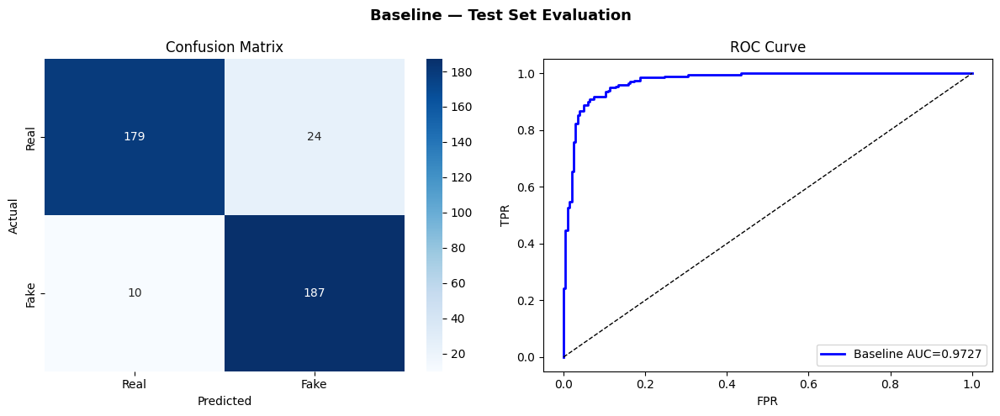

In [ ]:
# ── 2.7  Load best checkpoint + evaluate baseline on test set ─────────────────
ckpt = torch.load(baseline_ckpt, map_location=DEVICE, weights_only=False)
baseline_model.load_state_dict(ckpt['model_state'])
b_y_true, b_y_pred, b_y_prob = full_evaluate(baseline_model, baseline_test_loader)
b_acc = accuracy_score(b_y_true, b_y_pred)
b_auc = roc_auc_score(b_y_true, b_y_prob)
b_f1  = f1_score(b_y_true, b_y_pred)
b_prec = precision_score(b_y_true, b_y_pred, zero_division=0)
b_rec  = recall_score(b_y_true, b_y_pred)
print(f'\n BASELINE TEST RESULTS ')
print(f'    Accuracy  : {b_acc:.4f}')
print(f'    AUC-ROC   : {b_auc:.4f}')
print(f'    F1 (fake) : {b_f1:.4f}')
print('\n' + classification_report(b_y_true, b_y_pred, target_names=['Real', 'Fake']))

# Confusion matrix + ROC
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('Baseline — Test Set Evaluation', fontsize=13, fontweight='bold')
cm = confusion_matrix(b_y_true, b_y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0],
            xticklabels=['Real','Fake'], yticklabels=['Real','Fake'])
axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('Actual'); axes[0].set_title('Confusion Matrix')
fpr_b, tpr_b, _ = roc_curve(b_y_true, b_y_prob)
axes[1].plot(fpr_b, tpr_b, 'b-', lw=2, label=f'Baseline AUC={b_auc:.4f}')
axes[1].plot([0,1],[0,1],'k--',lw=1)
axes[1].set_xlabel('FPR'); axes[1].set_ylabel('TPR'); axes[1].set_title('ROC Curve')
axes[1].legend()
plt.tight_layout()
plt.savefig('/content/baseline_evaluation.png', dpi=120, bbox_inches='tight')
plt.show()

---
## Phase 3 — Per-Compression Evaluation
> Paper Table 4: accuracy across raw / c23 (HQ) / c40 (LQ) compression levels.
> If only c40 is downloaded, raw and c23 are approximated via JPEG re-encoding.

In [ ]:
# ── 3.1  Detect available compressions ───────────────────────────────────────
COMPRESSIONS = ['raw', 'c23', 'c40']

def detect_available_compressions(root, fake_methods):
    available = []
    for comp in COMPRESSIONS:
        real_p = root / 'original_sequences' / 'youtube' / comp / 'videos'
        fake_p = root / 'manipulated_sequences' / fake_methods[0] / comp / 'videos'
        real_ok = real_p.exists() and any(real_p.glob('*.mp4'))
        fake_ok = fake_p.exists() and any(fake_p.glob('*.mp4'))
        if real_ok or fake_ok:
            available.append(comp)
    return available

avail_compressions = detect_available_compressions(CFG.ROOT, CFG.FAKE_METHODS)
print(f'Available compressions on disk: {avail_compressions}')


Available compressions on disk: ['c40']


In [ ]:
# ── 3.2  Simulate missing compressions via JPEG re-encoding ──────────────────
def simulate_compression(img_bgr, level='c23'):
    quality_map = {'raw': None, 'c23': 85, 'c40': 60}
    q = quality_map.get(level)
    if q is None: return img_bgr.copy()
    _, enc = cv2.imencode('.jpg', img_bgr, [int(cv2.IMWRITE_JPEG_QUALITY), q])
    return cv2.imdecode(enc, cv2.IMREAD_COLOR)

class CompressionDataset(Dataset):
    def __init__(self, samples, transform, source_comp, target_comp):
        self.samples     = samples
        self.transform   = transform
        self.source_comp = source_comp
        self.target_comp = target_comp
    def __len__(self): return len(self.samples)
    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        img_bgr = cv2.imread(img_path)
        if img_bgr is None:
            img_bgr = np.zeros((CFG.FACE_SIZE, CFG.FACE_SIZE, 3), dtype=np.uint8)
        if self.target_comp != self.source_comp:
            img_bgr = simulate_compression(img_bgr, self.target_comp)
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        if self.transform: img_rgb = self.transform(img_rgb)
        return img_rgb, torch.tensor(label, dtype=torch.long)

@torch.no_grad()
def evaluate_at_compression(model, test_samples, transform, source_comp, target_comp, device, batch_size=32):
    dataset = CompressionDataset(test_samples, transform, source_comp, target_comp)
    loader  = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)
    model.eval()
    all_preds, all_probs, all_labels = [], [], []
    for images, labels in tqdm(loader, desc=f'  Eval {target_comp}', leave=False):
        images = images.to(device)
        out    = model(images)
        probs  = torch.softmax(out, dim=1)[:, 1].cpu().numpy()
        preds  = out.argmax(dim=1).cpu().numpy()
        all_probs.extend(probs); all_preds.extend(preds); all_labels.extend(labels.numpy())
    y_true, y_pred, y_prob = np.array(all_labels), np.array(all_preds), np.array(all_probs)
    acc = accuracy_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_prob) if len(set(y_true)) > 1 else 0.0
    return acc, auc, y_pred, y_prob, y_true

print('Compression evaluator defined.')

Compression evaluator defined.


In [ ]:
# ── 3.3  Run cross-compression evaluation → Table 4 ─────────────────────────
import pandas as pd
source_comp = CFG.COMPRESSION
print(f'\n Cross-Compression Evaluation (baseline model trained on {source_comp})\n')
comp_results = {}
for target in COMPRESSIONS:
    acc, auc, _, _, _ = evaluate_at_compression(
        baseline_model, test_samples, baseline_eval_tf, source_comp, target, DEVICE)
    comp_results[target] = {'Accuracy': round(acc*100,2), 'AUC-ROC': round(auc*100,2)}
    print(f'  {target:4s} → Accuracy: {acc*100:.2f}%   AUC: {auc*100:.2f}%')

comp_df = pd.DataFrame(comp_results).T
comp_df.index.name = 'Compression'
print('\n Per-Compression Performance:')
print(comp_df.to_string())


 Cross-Compression Evaluation (baseline model trained on c40)



  raw  → Accuracy: 91.50%   AUC: 97.27%


  c23  → Accuracy: 91.75%   AUC: 97.25%


  c40  → Accuracy: 91.50%   AUC: 97.27%

 Per-Compression Performance:
             Accuracy  AUC-ROC
Compression                   
raw             91.50    97.27
c23             91.75    97.25
c40             91.50    97.27


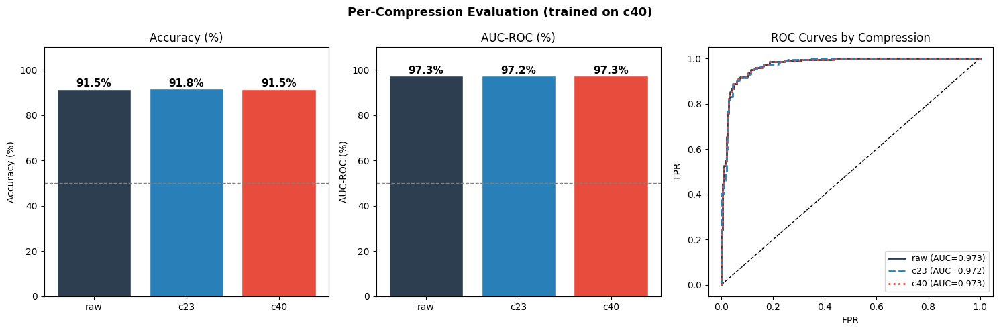

In [ ]:
# ── 3.4  Table 4 visualisation ────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle(f'Per-Compression Evaluation (trained on {CFG.COMPRESSION})',
             fontsize=13, fontweight='bold')
comp_colors = {'raw':'#2c3e50','c23':'#2980b9','c40':'#e74c3c'}
x_comp = list(comp_results.keys())
cols   = [comp_colors[c] for c in x_comp]

# Accuracy bars
bars = axes[0].bar(x_comp, [comp_results[c]['Accuracy'] for c in x_comp], color=cols, edgecolor='white')
axes[0].set_ylim(0,110); axes[0].axhline(50,color='gray',ls='--',lw=1)
axes[0].set_title('Accuracy (%)'); axes[0].set_ylabel('Accuracy (%)')
for b,v in zip(bars,[comp_results[c]['Accuracy'] for c in x_comp]):
    axes[0].text(b.get_x()+b.get_width()/2, v+1, f'{v:.1f}%', ha='center', fontsize=11, fontweight='bold')

# AUC bars
bars2 = axes[1].bar(x_comp, [comp_results[c]['AUC-ROC'] for c in x_comp], color=cols, edgecolor='white')
axes[1].set_ylim(0,110); axes[1].axhline(50,color='gray',ls='--',lw=1)
axes[1].set_title('AUC-ROC (%)'); axes[1].set_ylabel('AUC-ROC (%)')
for b,v in zip(bars2,[comp_results[c]['AUC-ROC'] for c in x_comp]):
    axes[1].text(b.get_x()+b.get_width()/2, v+1, f'{v:.1f}%', ha='center', fontsize=11, fontweight='bold')

# Overlaid ROC curves
axes[2].plot([0,1],[0,1],'k--',lw=1)
for target, col, ls in zip(COMPRESSIONS, list(comp_colors.values()), ['-','--',':']):
    _, _, _, y_prob_c, y_true_c = evaluate_at_compression(
        baseline_model, test_samples, baseline_eval_tf, source_comp, target, DEVICE)
    if len(set(y_true_c)) < 2: continue
    fpr_c,tpr_c,_ = roc_curve(y_true_c, y_prob_c)
    axes[2].plot(fpr_c,tpr_c,ls,color=col,lw=2,label=f'{target} (AUC={sklearn_auc(fpr_c,tpr_c):.3f})')
axes[2].set_title('ROC Curves by Compression'); axes[2].legend(fontsize=9)
axes[2].set_xlabel('FPR'); axes[2].set_ylabel('TPR')

plt.tight_layout()
plt.savefig('/content/table4_compression.png', dpi=130, bbox_inches='tight')
plt.show()

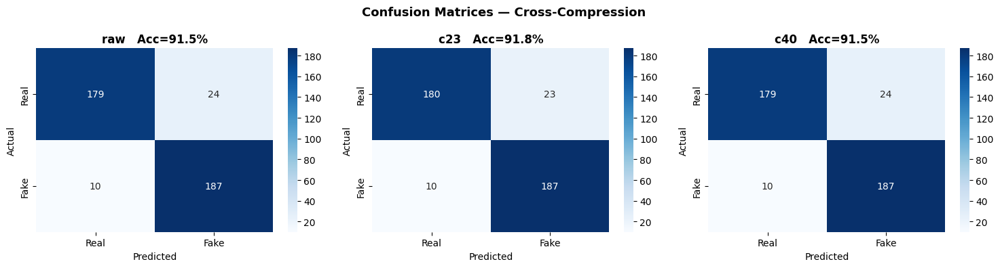

In [ ]:
# ── 3.5  Confusion matrices × compression ────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
fig.suptitle('Confusion Matrices — Cross-Compression ', fontsize=13, fontweight='bold')
for ax, target in zip(axes, COMPRESSIONS):
    _, _, y_pred_c, _, y_true_c = evaluate_at_compression(
        baseline_model, test_samples, baseline_eval_tf, source_comp, target, DEVICE)
    cm_c = confusion_matrix(y_true_c, y_pred_c)
    sns.heatmap(cm_c, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=['Real','Fake'], yticklabels=['Real','Fake'])
    ax.set_title(f'{target}   Acc={accuracy_score(y_true_c,y_pred_c)*100:.1f}%', fontweight='bold')
    ax.set_xlabel('Predicted'); ax.set_ylabel('Actual')
plt.tight_layout()
plt.savefig('/content/table4_conf_matrices.png', dpi=120, bbox_inches='tight')
plt.show()

---
##  Phase 4 — Per-Manipulation Method Evaluation
> Paper Table 5 / Fig. 6: evaluate separately on each manipulation method.
> Reveals which method is hardest for the model to detect.

In [ ]:
# ── 4.1  Per-method test set builder ─────────────────────────────────────────
def build_per_method_test_set(faces_dir, method, test_ratio=0.1):
    faces_dir = Path(faces_dir)
    real_imgs = list((faces_dir / 'real').rglob('*.jpg'))
    fake_imgs = list((faces_dir / method).rglob('*.jpg'))
    n_real_test = max(1, int(len(real_imgs) * (1 - CFG.TRAIN_SPLIT - CFG.VAL_SPLIT)))
    n_fake_test = max(1, int(len(fake_imgs) * (1 - CFG.TRAIN_SPLIT - CFG.VAL_SPLIT)))
    random.shuffle(real_imgs); random.shuffle(fake_imgs)
    return ([(str(p), 0) for p in real_imgs[:n_real_test]] +
            [(str(p), 1) for p in fake_imgs[:n_fake_test]])

print(' Per-method test-set builder defined.')

 Per-method test-set builder defined.


In [ ]:
# ── 4.2  Run per-method evaluation → Table 5 ─────────────────────────────────
method_results = {}
print('\n  Per-Method Evaluation \n')
for method in CFG.FAKE_METHODS:
    method_test = build_per_method_test_set(CFG.FACES_DIR, method)
    if not method_test: continue
    method_ds = BaselineDataset(method_test, transform=baseline_eval_tf)
    method_dl = DataLoader(method_ds, batch_size=CFG.BATCH_SIZE, shuffle=False, num_workers=2)
    y_true_m, y_pred_m, y_prob_m = full_evaluate(baseline_model, method_dl)
    acc  = accuracy_score(y_true_m, y_pred_m)
    auc  = roc_auc_score(y_true_m, y_prob_m) if len(set(y_true_m)) > 1 else 0.0
    f1   = f1_score(y_true_m, y_pred_m, zero_division=0)
    prec = precision_score(y_true_m, y_pred_m, zero_division=0)
    rec  = recall_score(y_true_m, y_pred_m)
    method_results[method] = {
        'Accuracy (%)': round(acc*100,2), 'AUC-ROC (%)': round(auc*100,2),
        'Precision': round(prec*100,2),   'Recall': round(rec*100,2),
        'F1-Score': round(f1*100,2),      'n_test': len(method_test),
        'y_true': y_true_m, 'y_pred': y_pred_m, 'y_prob': y_prob_m,
    }
    print(f'  {method:20s}: Acc={acc*100:.2f}%  AUC={auc*100:.2f}%  F1={f1*100:.2f}%  (n={len(method_test)})')

table5_df = pd.DataFrame({m:{k:v for k,v in d.items() if k not in ('y_true','y_pred','y_prob')}
                           for m,d in method_results.items()}).T
table5_df.index.name = 'Method'
print('\n Table 5:')
print(table5_df.to_string())


  Per-Method Evaluation 



  Test : 100%|██████████| 16/16 [00:01<00:00, 11.37it/s]


  Deepfakes           : Acc=98.79%  AUC=99.99%  F1=97.03%  (n=248)


  Test : 100%|██████████| 16/16 [00:01<00:00, 11.41it/s]


  Face2Face           : Acc=98.39%  AUC=99.98%  F1=96.08%  (n=248)


  Test : 100%|██████████| 16/16 [00:01<00:00, 11.25it/s]


  FaceSwap            : Acc=98.79%  AUC=99.52%  F1=97.03%  (n=248)


  Test : 100%|██████████| 16/16 [00:01<00:00, 11.38it/s]

  NeuralTextures      : Acc=97.18%  AUC=99.72%  F1=93.20%  (n=248)

 Table 5:
                Accuracy (%)  AUC-ROC (%)  Precision  Recall  F1-Score  n_test
Method                                                                        
Deepfakes              98.79        99.99      94.23  100.00     97.03   248.0
Face2Face              98.39        99.98      92.45  100.00     96.08   248.0
FaceSwap               98.79        99.52      94.23  100.00     97.03   248.0
NeuralTextures         97.18        99.72      88.89   97.96     93.20   248.0


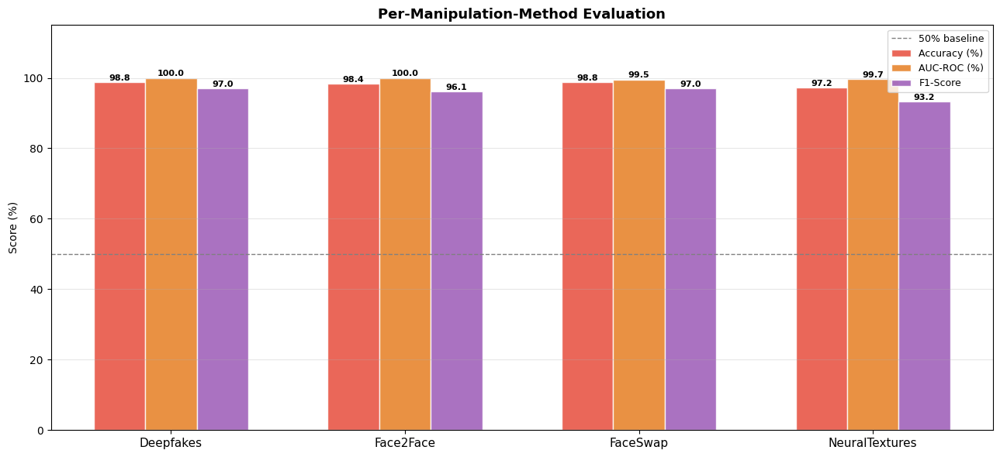

In [ ]:
# ── 4.3  Table 5 multi-metric bar chart ──────────────────────────────────────
methods_list = list(method_results.keys())
m_cols_list  = ['#e74c3c','#e67e22','#9b59b6','#3498db'][:len(methods_list)]
metrics_t5   = ['Accuracy (%)', 'AUC-ROC (%)', 'F1-Score']
x = np.arange(len(methods_list)); w = 0.22
fig, ax = plt.subplots(figsize=(13, 6))
for i, metric in enumerate(metrics_t5):
    vals = [method_results[m][metric] for m in methods_list]
    bars = ax.bar(x + i*w, vals, w, label=metric,
                  color=['#e74c3c','#e67e22','#9b59b6'][i], alpha=0.85, edgecolor='white')
    for bar, val in zip(bars, vals):
        ax.text(bar.get_x()+bar.get_width()/2, val+0.5, f'{val:.1f}', ha='center', fontsize=8, fontweight='bold')
ax.set_xticks(x+w); ax.set_xticklabels(methods_list, fontsize=11)
ax.set_ylim(0, 115); ax.axhline(50, color='gray', ls='--', lw=1, label='50% baseline')
ax.set_title('Per-Manipulation-Method Evaluation', fontsize=13, fontweight='bold')
ax.set_ylabel('Score (%)'); ax.legend(fontsize=9); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('/content/table5_per_method.png', dpi=130, bbox_inches='tight')
plt.show()

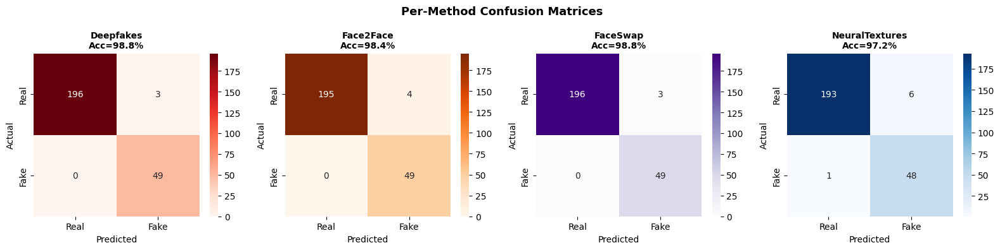

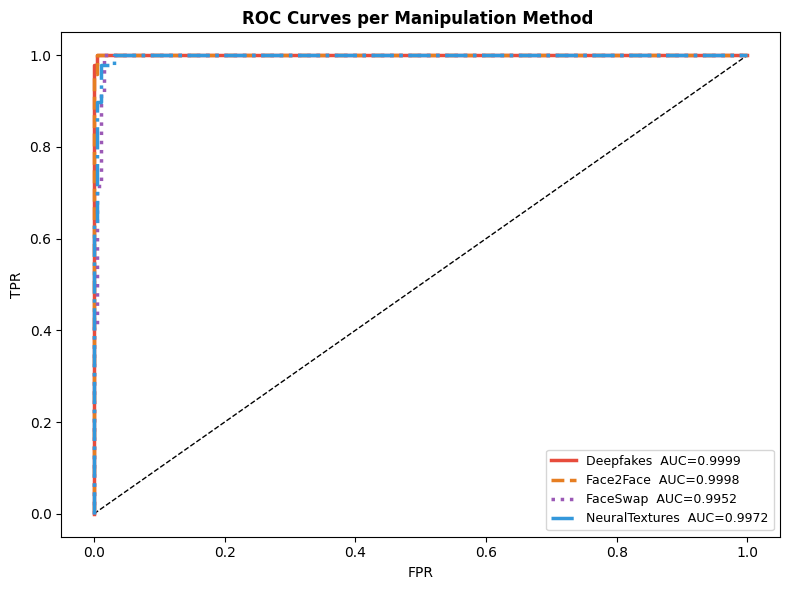


 Method Difficulty Ranking (hardest to detect first):
  #1  NeuralTextures        Acc=97.18%  AUC=99.72%
  #2  Face2Face             Acc=98.39%  AUC=99.98%
  #3  Deepfakes             Acc=98.79%  AUC=99.99%
  #4  FaceSwap              Acc=98.79%  AUC=99.52%


In [ ]:
# ── 4.4  Per-method confusion matrices + ROC overlay ─────────────────────────
n_m = len(method_results)
fig, axes = plt.subplots(1, n_m, figsize=(n_m*4, 4))
fig.suptitle('Per-Method Confusion Matrices ', fontsize=13, fontweight='bold')
cmaps_m = {'Deepfakes':'Reds','Face2Face':'Oranges','FaceSwap':'Purples','NeuralTextures':'Blues'}
for ax, method in zip(axes, method_results):
    r = method_results[method]
    sns.heatmap(confusion_matrix(r['y_true'],r['y_pred']), annot=True, fmt='d',
                cmap=cmaps_m.get(method,'Blues'), ax=ax,
                xticklabels=['Real','Fake'], yticklabels=['Real','Fake'])
    ax.set_title(f'{method}\nAcc={r["Accuracy (%)"]:.1f}%', fontweight='bold', fontsize=10)
    ax.set_xlabel('Predicted'); ax.set_ylabel('Actual')
plt.tight_layout()
plt.savefig('/content/table5_conf_matrices.png', dpi=120, bbox_inches='tight')
plt.show()

# ROC overlay
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot([0,1],[0,1],'k--',lw=1)
for method, col, ls in zip(method_results, m_cols_list, ['-','--',':','-.']):
    r = method_results[method]
    if len(set(r['y_true'])) < 2: continue
    fpr_m,tpr_m,_ = roc_curve(r['y_true'],r['y_prob'])
    ax.plot(fpr_m,tpr_m,ls,color=col,lw=2.5,label=f'{method}  AUC={sklearn_auc(fpr_m,tpr_m):.4f}')
ax.set_title('ROC Curves per Manipulation Method ', fontweight='bold')
ax.legend(fontsize=9); ax.set_xlabel('FPR'); ax.set_ylabel('TPR')
plt.tight_layout()
plt.savefig('/content/table5_roc_overlay.png', dpi=130, bbox_inches='tight')
plt.show()

# Method difficulty ranking
print('\n Method Difficulty Ranking (hardest to detect first):')
ranked = sorted(method_results.items(), key=lambda x: x[1]['Accuracy (%)'])
for rank, (method, r) in enumerate(ranked, 1):
    print(f'  #{rank}  {method:20s}  Acc={r["Accuracy (%)"]:.2f}%  AUC={r["AUC-ROC (%)"]:.2f}%')

---
## Phase 5 — Video-Level Prediction
> Per-frame inference aggregated by averaging P(fake) across frames.

In [ ]:
# ── 5.1  Video-level prediction function ─────────────────────────────────────
@torch.no_grad()
def predict_video(video_path, model, face_detector, transform, n_frames=20, threshold=0.5):
    model.eval()
    cap   = cv2.VideoCapture(str(video_path))
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    indices = np.linspace(0, total - 1, n_frames, dtype=int)
    frame_probs = []
    for idx in indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, int(idx))
        ret, frame = cap.read()
        if not ret: continue
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        try: face = face_detector(frame_rgb)
        except: face = None
        if face is None:
            face_img = cv2.resize(frame_rgb, (CFG.FACE_SIZE, CFG.FACE_SIZE))
        else:
            face_img = face.permute(1, 2, 0).numpy().astype(np.uint8)
        tensor = transform(face_img).unsqueeze(0).to(DEVICE)
        prob_fake = torch.softmax(model(tensor), dim=1)[0, 1].item()
        frame_probs.append(prob_fake)
    cap.release()
    if not frame_probs: return 'UNKNOWN', 0.0, []
    confidence = float(np.mean(frame_probs))
    return ('FAKE' if confidence >= threshold else 'REAL'), confidence, frame_probs

def display_inference_result(video_path, label, confidence, frame_probs):
    color = '#e74c3c' if label == 'FAKE' else '#2ecc71'
    print(f'\n{Path(video_path).name}  →  {label}  (conf={confidence:.4f})')
    plt.figure(figsize=(9, 3))
    plt.plot(frame_probs, 'o-', color=color, lw=1.5)
    plt.axhline(0.5, color='gray', ls='--', label='Threshold 0.5')
    plt.fill_between(range(len(frame_probs)), frame_probs, 0.5, alpha=0.15, color=color)
    plt.ylim(0, 1); plt.xlabel('Frame'); plt.ylabel('P(fake)')
    plt.title(f'{Path(video_path).name} → {label} (mean={confidence:.4f})', color=color, fontweight='bold')
    plt.legend(); plt.tight_layout(); plt.show()

print('Video inference functions defined.')

Video inference functions defined.



066.mp4  →  REAL  (conf=0.0433)


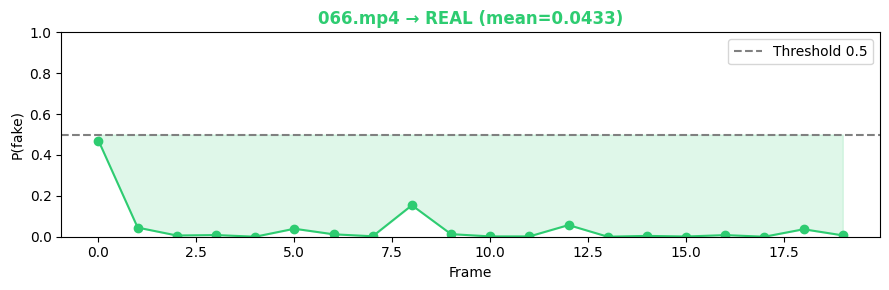


147_055.mp4  →  FAKE  (conf=0.9968)


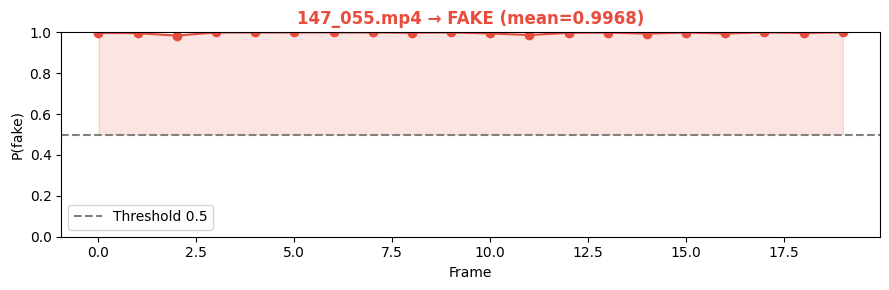

In [ ]:
# ── 5.2  Demo: 1 real + 1 fake video ─────────────────────────────────────────
real_vids = sorted((CFG.ROOT/'original_sequences'/'youtube'/CFG.COMPRESSION/'videos').glob('*.mp4'))
fake_vids = sorted((CFG.ROOT/'manipulated_sequences'/'Deepfakes'/CFG.COMPRESSION/'videos').glob('*.mp4'))
for vp in [random.choice(real_vids), random.choice(fake_vids)]:
    label, conf, probs = predict_video(vp, baseline_model, face_detector, baseline_eval_tf, n_frames=20)
    display_inference_result(vp, label, conf, probs)

---
## Phase 6 — Novelty A: Forensic Feature Design (FFT + Edge)
> **Our contribution beyond the paper:** A 9-channel multi-stream input fusing RGB, FFT magnitude spectrum, and Sobel/Canny edge maps.
>
> | Stream | Channels | What it captures |
> |--------|----------|-----------------|
> | RGB | 3 | Standard visual semantics (same as paper) |
> | FFT | 3 | Periodic GAN upsampling artifacts (checkerboard patterns in frequency domain) |
> | Edge | 3 | Blending seam discontinuities at face boundaries (Sobel-X, Sobel-Y, Canny) |

In [ ]:
# ── 7.1  Forensic Feature Extraction Functions ────────────────────────────────

def compute_fft_channels(img_np):
    out = np.zeros_like(img_np, dtype=np.float32)
    for c in range(3):
        channel = img_np[:, :, c].astype(np.float32)
        f   = np.fft.fft2(channel)
        fs  = np.fft.fftshift(f)          # DC at centre
        mag = np.log1p(np.abs(fs))        # log-magnitude
        mag_min, mag_max = mag.min(), mag.max()
        if mag_max > mag_min:
            mag = (mag - mag_min) / (mag_max - mag_min)
        out[:, :, c] = mag
    return out


def compute_edge_channels(img_np):
    gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)

    # Sobel gradients (ksize=3, scale=1)
    sx = cv2.Sobel(gray, cv2.CV_32F, 1, 0, ksize=3)
    sy = cv2.Sobel(gray, cv2.CV_32F, 0, 1, ksize=3)

    # Canny edges
    canny = cv2.Canny(gray, threshold1=50, threshold2=150).astype(np.float32)

    def norm(x):
        lo, hi = x.min(), x.max()
        return (x - lo) / (hi - lo + 1e-8)

    out = np.stack([norm(sx), norm(sy), norm(canny)], axis=-1).astype(np.float32)
    return out

print('FFT and Edge feature extractors defined.')

FFT and Edge feature extractors defined.


=== REAL FACE ===


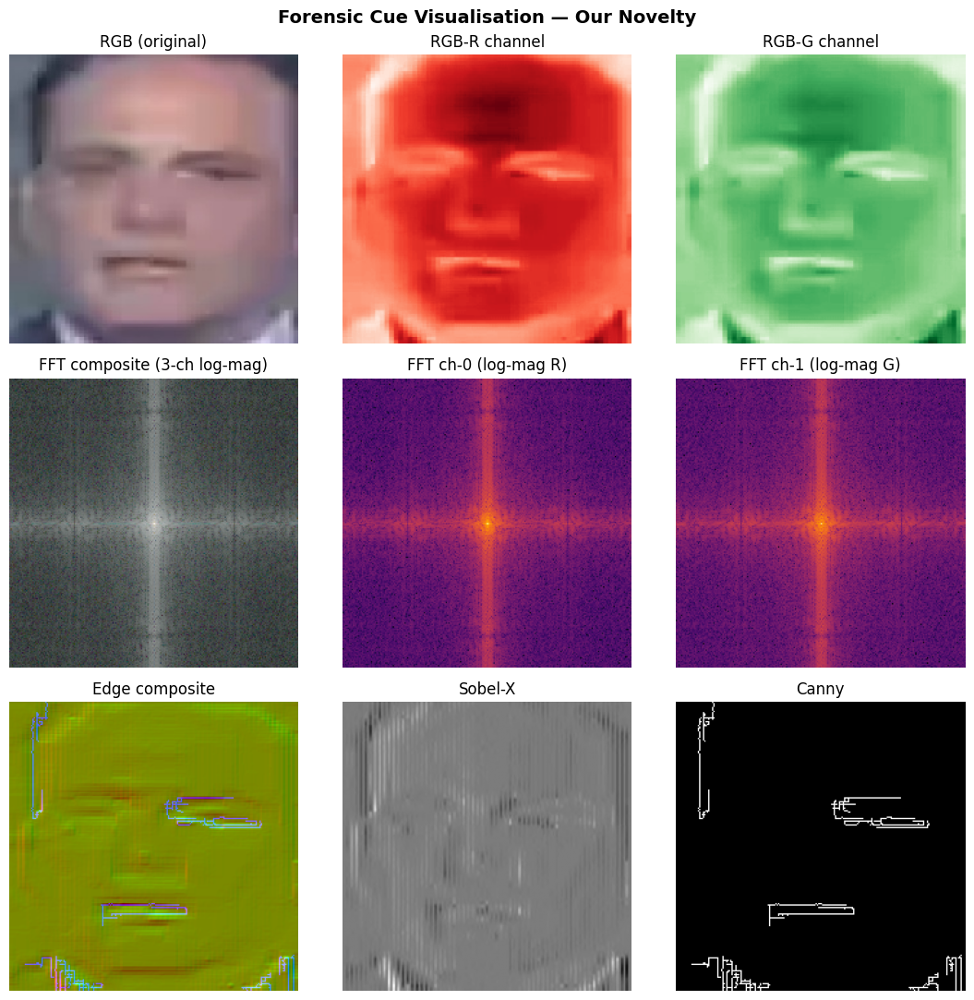

=== FAKE FACE (Deepfakes) ===


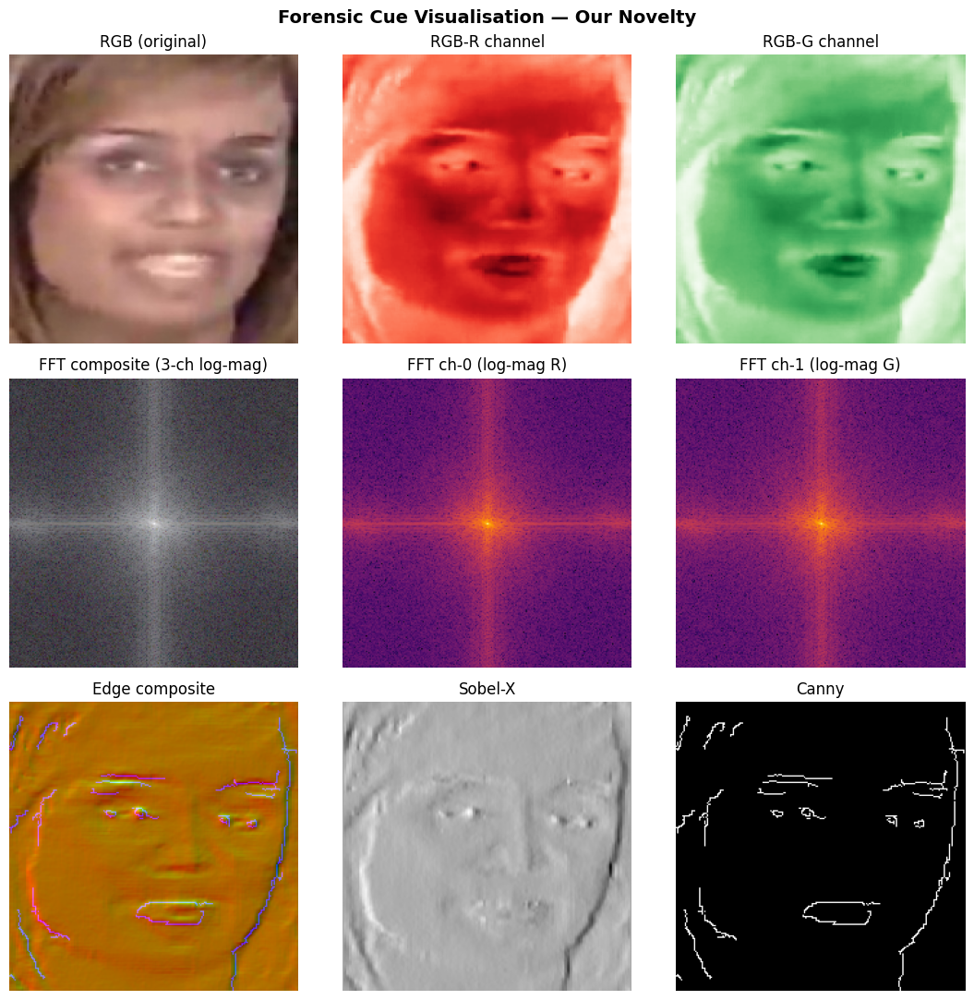

In [ ]:
# ── 7.2  Visualise Forensic Cues on a Sample Image ───────────────────────────
def visualize_forensic_cues(img_path):
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_rgb = cv2.resize(img_rgb, (224, 224))

    fft_img  = compute_fft_channels(img_rgb)
    edge_img = compute_edge_channels(img_rgb)

    fig, axes = plt.subplots(3, 3, figsize=(11, 11))
    fig.suptitle('Forensic Cue Visualisation — Our Novelty', fontsize=14, fontweight='bold')

    # Row 0: RGB
    axes[0, 0].imshow(img_rgb); axes[0, 0].set_title('RGB (original)')
    axes[0, 1].imshow(img_rgb[:,:,0], cmap='Reds');  axes[0, 1].set_title('RGB-R channel')
    axes[0, 2].imshow(img_rgb[:,:,1], cmap='Greens'); axes[0, 2].set_title('RGB-G channel')

    # Row 1: FFT
    axes[1, 0].imshow(fft_img); axes[1, 0].set_title('FFT composite (3-ch log-mag)')
    for i in range(3):
        axes[1, i+1 if i < 2 else 2].imshow(fft_img[:,:,min(i,2)], cmap='inferno')
    axes[1, 1].set_title('FFT ch-0 (log-mag R)'); axes[1, 2].set_title('FFT ch-1 (log-mag G)')

    # Row 2: Edge
    axes[2, 0].imshow(edge_img); axes[2, 0].set_title('Edge composite')
    axes[2, 1].imshow(edge_img[:,:,0], cmap='gray'); axes[2, 1].set_title('Sobel-X')
    axes[2, 2].imshow(edge_img[:,:,2], cmap='gray'); axes[2, 2].set_title('Canny')

    for ax in axes.ravel(): ax.axis('off')
    plt.tight_layout()
    plt.savefig('/content/forensic_cues.png', dpi=120, bbox_inches='tight')
    plt.show()

# visualise one real and one fake
real_sample = next((str(p) for p in (CFG.FACES_DIR/'real').rglob('*.jpg')), None)
fake_sample = next((str(p) for p in (CFG.FACES_DIR/'Deepfakes').rglob('*.jpg')), None)

if real_sample:
    print('=== REAL FACE ===')
    visualize_forensic_cues(real_sample)
if fake_sample:
    print('=== FAKE FACE (Deepfakes) ===')
    visualize_forensic_cues(fake_sample)

In [ ]:
# ── 7.3  Novel Dataset — 9-channel (RGB + FFT + Edge) ─────────────────────────

NOVEL_MEAN = IMAGENET_MEAN + [0.5, 0.5, 0.5] + [0.5, 0.5, 0.5]   # 9 values
NOVEL_STD  = IMAGENET_STD  + [0.5, 0.5, 0.5] + [0.5, 0.5, 0.5]

class ForensicsAwareDataset(Dataset):
    def __init__(self, samples, augment=False, face_size=224):
        self.samples   = samples
        self.augment   = augment
        self.face_size = face_size

    def __len__(self):
        return len(self.samples)

    def _augment(self, img):
        if random.random() > 0.5:
            img = cv2.flip(img, 1)
        angle = random.uniform(-10, 10)
        M = cv2.getRotationMatrix2D(
            (img.shape[1]//2, img.shape[0]//2), angle, 1.0
        )
        img = cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))
        factor = random.uniform(0.8, 1.2)
        img = np.clip(img.astype(np.float32) * factor, 0, 255).astype(np.uint8)
        return img

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        img = cv2.imread(img_path)
        if img is None:
            img = np.zeros((self.face_size, self.face_size, 3), dtype=np.uint8)
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (self.face_size, self.face_size))

        if self.augment:
            img = self._augment(img)

        # ── Stream 1: RGB → (3, H, W) ─────────────────────────────────────
        rgb_t = torch.from_numpy(img).permute(2, 0, 1).float() / 255.0
        for c in range(3):
            rgb_t[c] = (rgb_t[c] - IMAGENET_MEAN[c]) / IMAGENET_STD[c]

        # ── Stream 2: FFT → (3, H, W) ─────────────────────────────────────
        fft_np = compute_fft_channels(img)
        fft_t  = torch.from_numpy(fft_np).permute(2, 0, 1)
        for c in range(3):
            fft_t[c] = (fft_t[c] - 0.5) / 0.5

        # ── Stream 3: Edge → (3, H, W) ────────────────────────────────────
        edge_np = compute_edge_channels(img)
        edge_t  = torch.from_numpy(edge_np).permute(2, 0, 1)
        for c in range(3):
            edge_t[c] = (edge_t[c] - 0.5) / 0.5

        # ── Fuse: (9, H, W) ───────────────────────────────────────────────
        fused = torch.cat([rgb_t, fft_t, edge_t], dim=0)

        return fused, torch.tensor(label, dtype=torch.long)


# ── Create DataLoaders for novel model ────────────────────────────────────────
novel_train_ds = ForensicsAwareDataset(train_samples, augment=True)
novel_val_ds   = ForensicsAwareDataset(val_samples,   augment=False)
novel_test_ds  = ForensicsAwareDataset(test_samples,  augment=False)

novel_train_loader = DataLoader(novel_train_ds, batch_size=CFG.BATCH_SIZE,
                                shuffle=True,  num_workers=2, pin_memory=True)
novel_val_loader   = DataLoader(novel_val_ds,   batch_size=CFG.BATCH_SIZE,
                                shuffle=False, num_workers=2, pin_memory=True)
novel_test_loader  = DataLoader(novel_test_ds,  batch_size=CFG.BATCH_SIZE,
                                shuffle=False, num_workers=2, pin_memory=True)

print(f'Novel 9-ch DataLoaders ready — {len(novel_train_loader)} train batches')
print(f'   Train samples : {len(novel_train_ds)}')
print(f'   Val   samples : {len(novel_val_ds)}')
print(f'   Test  samples : {len(novel_test_ds)}')


Novel 9-ch DataLoaders ready — 200 train batches
   Train samples : 3200
   Val   samples : 400
   Test  samples : 400


---
## Phase 7 — 9-Channel XceptionNet — Train & Evaluate
> Modified XceptionNet with widened entry Conv2d (3→9 channels).
> RGB filters warm-started from ImageNet; FFT/Edge filters initialised as scaled copies.

In [ ]:
# ── 7.4  Novel Model — 9-channel XceptionNet ─────────────────────────────────
import torch
import torch.nn as nn
import timm

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── Baseline Model (3-channel Xception) ──────────────────────────────────────
baseline_model = timm.create_model('xception', pretrained=True, num_classes=2).to(DEVICE)

total = sum(p.numel() for p in baseline_model.parameters())
trainable = sum(p.numel() for p in baseline_model.parameters() if p.requires_grad)

print(f'Baseline XceptionNet (3-ch) | Total: {total:,}  Trainable: {trainable:,}')


# ── Novel Model — 9-channel XceptionNet ──────────────────────────────────────
class ForensicsAwareXception(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()

        base = timm.create_model('xception', pretrained=True, num_classes=num_classes)

        old_conv = base.conv1
        new_conv = nn.Conv2d(
            9, old_conv.out_channels,
            kernel_size=old_conv.kernel_size,
            stride=old_conv.stride,
            padding=old_conv.padding,
            bias=False
        )

        with torch.no_grad():
            new_conv.weight[:, :3, :, :] = old_conv.weight
            new_conv.weight[:, 3:6, :, :] = old_conv.weight * 0.1
            new_conv.weight[:, 6:9, :, :] = old_conv.weight * 0.1

        base.conv1 = new_conv
        self.model = base

    def forward(self, x):
        return self.model(x)

novel_model = ForensicsAwareXception(num_classes=2).to(DEVICE)

total_n     = sum(p.numel() for p in novel_model.parameters())
trainable_n = sum(p.numel() for p in novel_model.parameters() if p.requires_grad)

print(f'Forensics-Aware XceptionNet (9-ch) | Total: {total_n:,}  Trainable: {trainable_n:,}')

overhead = total_n - total
percent  = (overhead / total) * 100

print(f'   Parameter overhead vs baseline: +{overhead:,} (+{percent:.2f}%)')

Baseline XceptionNet (3-ch) | Total: 20,811,050  Trainable: 20,811,050
Forensics-Aware XceptionNet (9-ch) | Total: 20,812,778  Trainable: 20,812,778
   Parameter overhead vs baseline: +1,728 (+0.01%)


In [ ]:
# ── 7.5  Train Novel Model ────────────────────────────────────────────────────
print('=' * 60)
print('  NOVELTY TRAINING (RGB + FFT + Edge XceptionNet)')
print('=' * 60)

novel_ckpt = CFG.CKPT_DIR / 'novel_best.pth'
novel_history = run_training(
    novel_model,
    novel_train_loader,
    novel_val_loader,
    novel_ckpt,
    tag='NOVELTY'
)

  NOVELTY TRAINING (RGB + FFT + Edge XceptionNet)


[NOVELTY] Epoch [01/10]  Train 0.5500/0.7094  Val 0.3367/0.8600  AUC 0.9398  (74.0s)
Saved  (val_acc=0.8600)


[NOVELTY] Epoch [02/10]  Train 0.3127/0.8672  Val 0.2705/0.8875  AUC 0.9638  (73.0s)
Saved  (val_acc=0.8875)


[NOVELTY] Epoch [03/10]  Train 0.2168/0.9069  Val 0.2033/0.9125  AUC 0.9790  (72.8s)
Saved  (val_acc=0.9125)


[NOVELTY] Epoch [04/10]  Train 0.1530/0.9391  Val 0.2118/0.9150  AUC 0.9787  (72.8s)
Saved  (val_acc=0.9150)


[NOVELTY] Epoch [05/10]  Train 0.1179/0.9581  Val 0.1848/0.9175  AUC 0.9814  (72.6s)
Saved  (val_acc=0.9175)


[NOVELTY] Epoch [06/10]  Train 0.0780/0.9747  Val 0.1794/0.9225  AUC 0.9797  (72.8s)
Saved  (val_acc=0.9225)


[NOVELTY] Epoch [07/10]  Train 0.0652/0.9809  Val 0.1623/0.9325  AUC 0.9823  (72.5s)
Saved  (val_acc=0.9325)


[NOVELTY] Epoch [08/10]  Train 0.0564/0.9803  Val 0.1691/0.9275  AUC 0.9808  (73.2s)


[NOVELTY] Epoch [09/10]  Train 0.0396/0.9884  Val 0.1508/0.9400  AUC 0.9851  (72.5s)
Saved  (val_acc=0.9400)


[NOVELTY] Epoch [10/10]  Train 0.0299/0.9916  Val 0.1546/0.9400  AUC 0.9858  (73.3s)
 [NOVELTY] Done. Best val_acc=0.9400


In [ ]:
# ── 7.6  Evaluate Novel Model ─────────────────────────────────────────────────
ckpt = torch.load(novel_ckpt, map_location=DEVICE, weights_only=False)
novel_model.load_state_dict(ckpt['model_state'])

n_y_true, n_y_pred, n_y_prob = full_evaluate(novel_model, novel_test_loader)

n_acc = accuracy_score(n_y_true, n_y_pred)
n_auc = roc_auc_score(n_y_true, n_y_prob)

print(f'\n NOVELTY   |  Test Accuracy: {n_acc:.4f}  |  AUC-ROC: {n_auc:.4f}')
print('\n' + classification_report(n_y_true, n_y_pred, target_names=['Real', 'Fake']))

  Test : 100%|██████████| 25/25 [00:03<00:00,  6.56it/s]


 NOVELTY   |  Test Accuracy: 0.9275  |  AUC-ROC: 0.9810

              precision    recall  f1-score   support

        Real       0.94      0.91      0.93       203
        Fake       0.91      0.94      0.93       197

    accuracy                           0.93       400
   macro avg       0.93      0.93      0.93       400
weighted avg       0.93      0.93      0.93       400



---
## Phase 8 — Baseline vs Forensics-Aware Comparison
> Head-to-head comparison of RGB-only vs RGB+FFT+Edge on identical test sets.

In [ ]:
# ── 8.1  Side-by-side numerical comparison ───────────────────────────────────
from sklearn.metrics import f1_score, precision_score, recall_score

def detailed_metrics(y_true, y_pred, y_prob, name):
    acc  = accuracy_score(y_true, y_pred)
    auc  = roc_auc_score(y_true, y_prob)
    f1   = f1_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec  = recall_score(y_true, y_pred)
    print(f'{name:30s}  Acc={acc:.4f}  AUC={auc:.4f}  F1={f1:.4f}  '
          f'Prec={prec:.4f}  Rec={rec:.4f}')
    return dict(name=name, acc=acc, auc=auc, f1=f1, precision=prec, recall=rec)

print('\n' + '─'*85)
print(f'{"Model":30s}  {"Acc":>6}  {"AUC":>6}  {"F1":>6}  {"Prec":>6}  {"Rec":>6}')
print('─'*85)
b_metrics = detailed_metrics(b_y_true, b_y_pred, b_y_prob,
                              'Baseline (RGB-only XceptionNet)')
n_metrics = detailed_metrics(n_y_true, n_y_pred, n_y_prob,
                              'Novelty (RGB+FFT+Edge XceptionNet)')
print('─'*85)

delta_acc = n_metrics['acc']  - b_metrics['acc']
delta_auc = n_metrics['auc']  - b_metrics['auc']
delta_f1  = n_metrics['f1']   - b_metrics['f1']
print(f'\n  Δ Accuracy  : {delta_acc:+.4f}')
print(f'  Δ AUC-ROC   : {delta_auc:+.4f}')
print(f'  Δ F1 (fake) : {delta_f1:+.4f}')


─────────────────────────────────────────────────────────────────────────────────────
Model                              Acc     AUC      F1    Prec     Rec
─────────────────────────────────────────────────────────────────────────────────────
Baseline (RGB-only XceptionNet)  Acc=0.9150  AUC=0.9727  F1=0.9167  Prec=0.8863  Rec=0.9492
Novelty (RGB+FFT+Edge XceptionNet)  Acc=0.9275  AUC=0.9810  F1=0.9277  Prec=0.9118  Rec=0.9442
─────────────────────────────────────────────────────────────────────────────────────

  Δ Accuracy  : +0.0125
  Δ AUC-ROC   : +0.0084
  Δ F1 (fake) : +0.0110


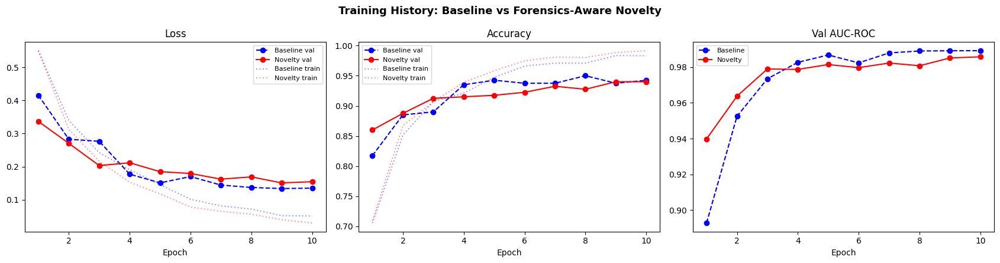

In [ ]:
# ── 8.2  Training curves — Baseline vs Novelty ───────────────────────────────
epochs = range(1, CFG.EPOCHS + 1)

fig, axes = plt.subplots(1, 3, figsize=(17, 4.5))
fig.suptitle('Training History: Baseline vs Forensics-Aware Novelty',
             fontsize=13, fontweight='bold')

# Loss
axes[0].plot(epochs, baseline_history['val_loss'],  'b--o', label='Baseline val')
axes[0].plot(epochs, novel_history['val_loss'],     'r-o',  label='Novelty val')
axes[0].plot(epochs, baseline_history['train_loss'], 'b:',  alpha=0.4, label='Baseline train')
axes[0].plot(epochs, novel_history['train_loss'],    'r:',  alpha=0.4, label='Novelty train')
axes[0].set_title('Loss'); axes[0].legend(fontsize=8); axes[0].set_xlabel('Epoch')

# Accuracy
axes[1].plot(epochs, baseline_history['val_acc'],  'b--o', label='Baseline val')
axes[1].plot(epochs, novel_history['val_acc'],     'r-o',  label='Novelty val')
axes[1].plot(epochs, baseline_history['train_acc'], 'b:',  alpha=0.4, label='Baseline train')
axes[1].plot(epochs, novel_history['train_acc'],    'r:',  alpha=0.4, label='Novelty train')
axes[1].set_title('Accuracy'); axes[1].legend(fontsize=8); axes[1].set_xlabel('Epoch')

# AUC
axes[2].plot(epochs, baseline_history['val_auc'], 'b--o', label='Baseline')
axes[2].plot(epochs, novel_history['val_auc'],    'r-o',  label='Novelty')
axes[2].set_title('Val AUC-ROC'); axes[2].legend(fontsize=8); axes[2].set_xlabel('Epoch')

plt.tight_layout()
plt.savefig('/content/training_curves_comparison.png', dpi=130, bbox_inches='tight')
plt.show()

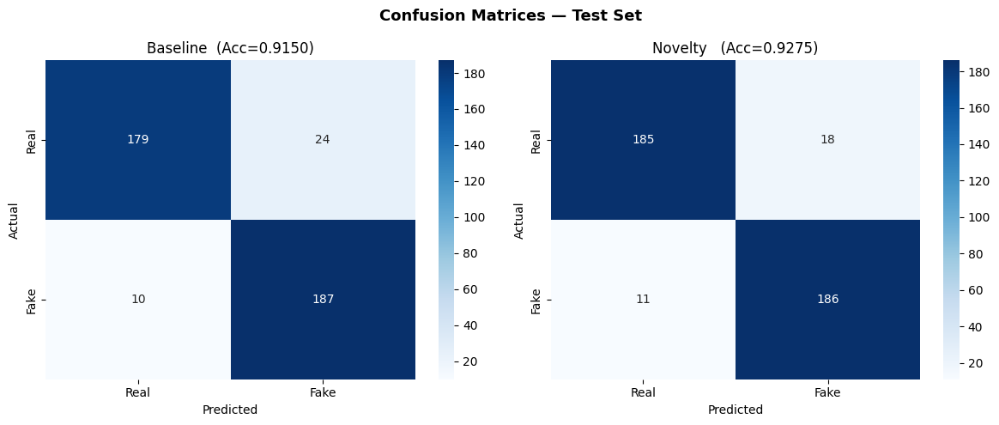

In [ ]:
# ── 8.3  Confusion matrices side-by-side ─────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('Confusion Matrices — Test Set', fontsize=13, fontweight='bold')

for ax, y_true, y_pred, title in [
    (axes[0], b_y_true, b_y_pred, f'Baseline  (Acc={b_acc:.4f})'),
    (axes[1], n_y_true, n_y_pred, f'Novelty   (Acc={n_acc:.4f})')
]:
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=['Real','Fake'], yticklabels=['Real','Fake'])
    ax.set_xlabel('Predicted'); ax.set_ylabel('Actual')
    ax.set_title(title)

plt.tight_layout()
plt.savefig('/content/confusion_matrices.png', dpi=130, bbox_inches='tight')
plt.show()

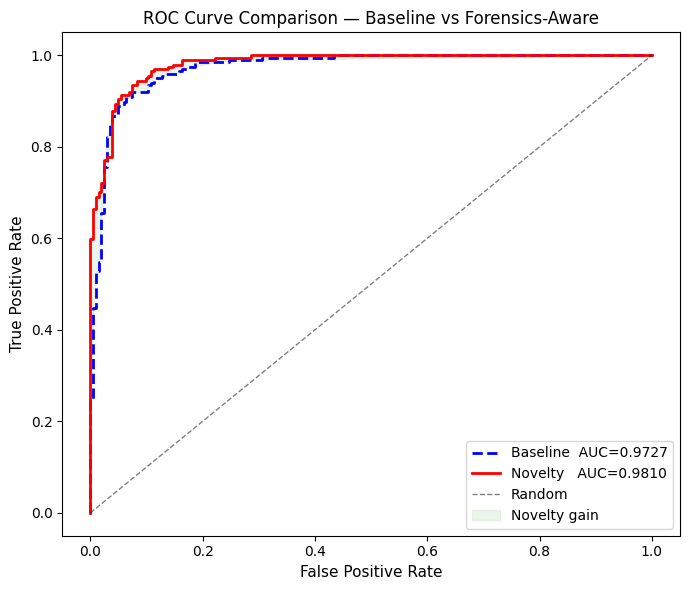

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

fig, ax = plt.subplots(figsize=(7, 6))

b_fpr, b_tpr, _ = roc_curve(b_y_true, b_y_prob)
n_fpr, n_tpr, _ = roc_curve(n_y_true, n_y_prob)

# Interpolation
b_tpr_interp = np.interp(n_fpr, b_fpr, b_tpr)

# Plots
ax.plot(b_fpr, b_tpr, 'b--', lw=2, label=f'Baseline  AUC={b_auc:.4f}')
ax.plot(n_fpr, n_tpr, 'r-',  lw=2, label=f'Novelty   AUC={n_auc:.4f}')
ax.plot([0,1], [0,1], 'k--', lw=1, alpha=0.5, label='Random')

ax.fill_between(n_fpr, n_tpr, b_tpr_interp,
                alpha=0.08, color='green',
                label='Novelty gain')

# Labels
ax.set_xlabel('False Positive Rate', fontsize=11)
ax.set_ylabel('True Positive Rate', fontsize=11)
ax.set_title('ROC Curve Comparison — Baseline vs Forensics-Aware', fontsize=12)
ax.legend(fontsize=10)

plt.tight_layout()
plt.savefig('/content/roc_comparison.png', dpi=130, bbox_inches='tight')
plt.show()

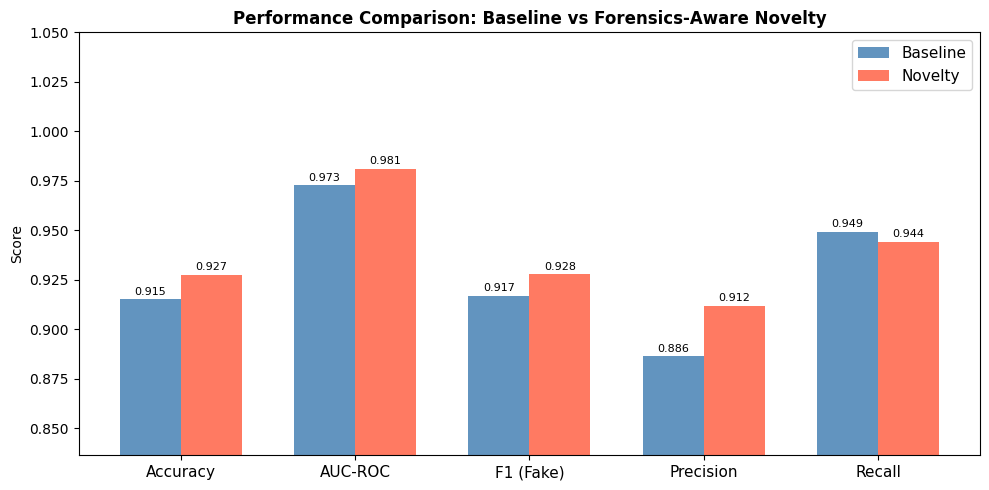

In [ ]:
# ── 8.5  Bar chart summary ────────────────────────────────────────────────────
metrics  = ['Accuracy', 'AUC-ROC', 'F1 (Fake)', 'Precision', 'Recall']
b_vals   = [b_metrics['acc'], b_metrics['auc'], b_metrics['f1'],
            b_metrics['precision'], b_metrics['recall']]
n_vals   = [n_metrics['acc'], n_metrics['auc'], n_metrics['f1'],
            n_metrics['precision'], n_metrics['recall']]

x    = np.arange(len(metrics))
w    = 0.35
fig, ax = plt.subplots(figsize=(10, 5))
bars_b = ax.bar(x - w/2, b_vals, w, label='Baseline', color='steelblue', alpha=0.85)
bars_n = ax.bar(x + w/2, n_vals, w, label='Novelty',  color='tomato',    alpha=0.85)

ax.set_ylabel('Score')
ax.set_title('Performance Comparison: Baseline vs Forensics-Aware Novelty',
             fontsize=12, fontweight='bold')
ax.set_xticks(x); ax.set_xticklabels(metrics, fontsize=11)
ax.set_ylim(max(0, min(b_vals + n_vals) - 0.05), 1.05)
ax.legend(fontsize=11)
ax.bar_label(bars_b, fmt='%.3f', padding=2, fontsize=8)
ax.bar_label(bars_n, fmt='%.3f', padding=2, fontsize=8)

plt.tight_layout()
plt.savefig('/content/metrics_barplot.png', dpi=130, bbox_inches='tight')
plt.show()

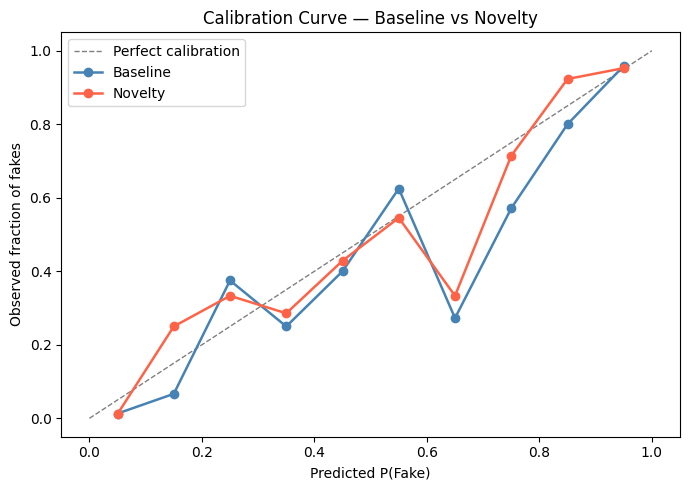

In [ ]:
# ── 8.6  Per-confidence-bin analysis (calibration insight) ───────────────────
def calibration_plot(y_true, y_prob, label, ax, color):
    bins = np.linspace(0, 1, 11)
    bin_centers, bin_frac = [], []
    for lo, hi in zip(bins[:-1], bins[1:]):
        mask = (y_prob >= lo) & (y_prob < hi)
        if mask.sum() > 0:
            bin_centers.append((lo+hi)/2)
            bin_frac.append(y_true[mask].mean())
    ax.plot(bin_centers, bin_frac, 'o-', color=color, label=label, lw=1.8)

fig, ax = plt.subplots(figsize=(7, 5))
ax.plot([0,1],[0,1],'k--',lw=1,alpha=0.5,label='Perfect calibration')
calibration_plot(b_y_true, b_y_prob, 'Baseline', ax, 'steelblue')
calibration_plot(n_y_true, n_y_prob, 'Novelty',  ax, 'tomato')
ax.set_xlabel('Predicted P(Fake)')
ax.set_ylabel('Observed fraction of fakes')
ax.set_title('Calibration Curve — Baseline vs Novelty')
ax.legend()
plt.tight_layout()
plt.savefig('/content/calibration.png', dpi=130, bbox_inches='tight')
plt.show()

In [ ]:
# ── 8.7  Final summary table ─────────────────────────────────────────────────
print('\n' + '='*70)
print('  FINAL RESULTS SUMMARY')
print('='*70)
print(f'{"Metric":<22} {"Baseline":>12} {"Novelty":>12} {"Delta":>10}')
print('-'*70)
for metric, bv, nv in [
    ('Accuracy',          b_metrics['acc'],       n_metrics['acc']),
    ('AUC-ROC',           b_metrics['auc'],       n_metrics['auc']),
    ('F1 Score (Fake)',   b_metrics['f1'],        n_metrics['f1']),
    ('Precision (Fake)',  b_metrics['precision'], n_metrics['precision']),
    ('Recall (Fake)',     b_metrics['recall'],    n_metrics['recall']),
]:
    delta = nv - bv
    flag  = '▲' if delta > 0.001 else ('▼' if delta < -0.001 else '─')
    print(f'{metric:<22} {bv:>12.4f} {nv:>12.4f} {flag} {delta:>+8.4f}')
print('='*70)
print()
print('Model architecture:')
print('  Baseline : XceptionNet (3-ch RGB input)')
print('  Novelty  : XceptionNet (9-ch RGB+FFT+Edge input, warm-started)')
print(f'\n  Parameter overhead of novelty: +{total_n - total:,} params '
      f'({(total_n-total)/total*100:.2f}%)')
print(f'  (Extra params come only from the widened first Conv2d layer)')


  FINAL RESULTS SUMMARY
Metric                     Baseline      Novelty      Delta
----------------------------------------------------------------------
Accuracy                     0.9150       0.9275 ▲  +0.0125
AUC-ROC                      0.9727       0.9810 ▲  +0.0084
F1 Score (Fake)              0.9167       0.9277 ▲  +0.0110
Precision (Fake)             0.8863       0.9118 ▲  +0.0255
Recall (Fake)                0.9492       0.9442 ▼  -0.0051

Model architecture:
  Baseline : XceptionNet (3-ch RGB input)
  Novelty  : XceptionNet (9-ch RGB+FFT+Edge input, warm-started)

  Parameter overhead of novelty: +1,728 params (0.01%)
  (Extra params come only from the widened first Conv2d layer)


Novelty B: Explainability

---
## Phase 9 —  Grad-CAM Heatmaps
> Visualises *where* in the face the model looks to decide real vs fake.
> Highlights artifacts: blending edges, eye regions, hair boundaries.

In [ ]:
# ── 11.1  Install torchcam ────────────────────────────────────────────────────
!pip install -q torchcam
print('torchcam installed.')

torchcam installed.


In [ ]:
# ── 11.2  Grad-CAM helper ─────────────────────────────────────────────────────
import torch, cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from torchcam.methods import GradCAM
from torchcam.utils   import overlay_mask
from torchvision.transforms.functional import to_pil_image
from PIL import Image as PILImage

def get_xception_target_layer(model):
    target = None
    for name, mod in model.named_modules():
        if isinstance(mod, torch.nn.Conv2d):
            target = mod
            target_name = name
    print(f'   Grad-CAM target layer : {target_name}')
    return target


def gradcam_on_image(model, img_bgr, transform, device,
                     class_idx=1, face_size=224):
    model.eval()
    img_rgb   = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    tensor    = transform(img_rgb).unsqueeze(0).to(device)

    target_layer = get_xception_target_layer(model)
    extractor    = GradCAM(model, target_layer=target_layer)

    with torch.enable_grad():
        output   = model(tensor)
        prob_fake = torch.softmax(output, dim=1)[0, class_idx].item()
        activation_map = extractor(class_idx, output)[0]

    face_pil  = to_pil_image(img_rgb)
    result    = overlay_mask(
        face_pil,
        to_pil_image(activation_map, mode='F'),
        alpha=0.5
    )
    return result, prob_fake


print('Grad-CAM helpers defined.')

Grad-CAM helpers defined.


   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise


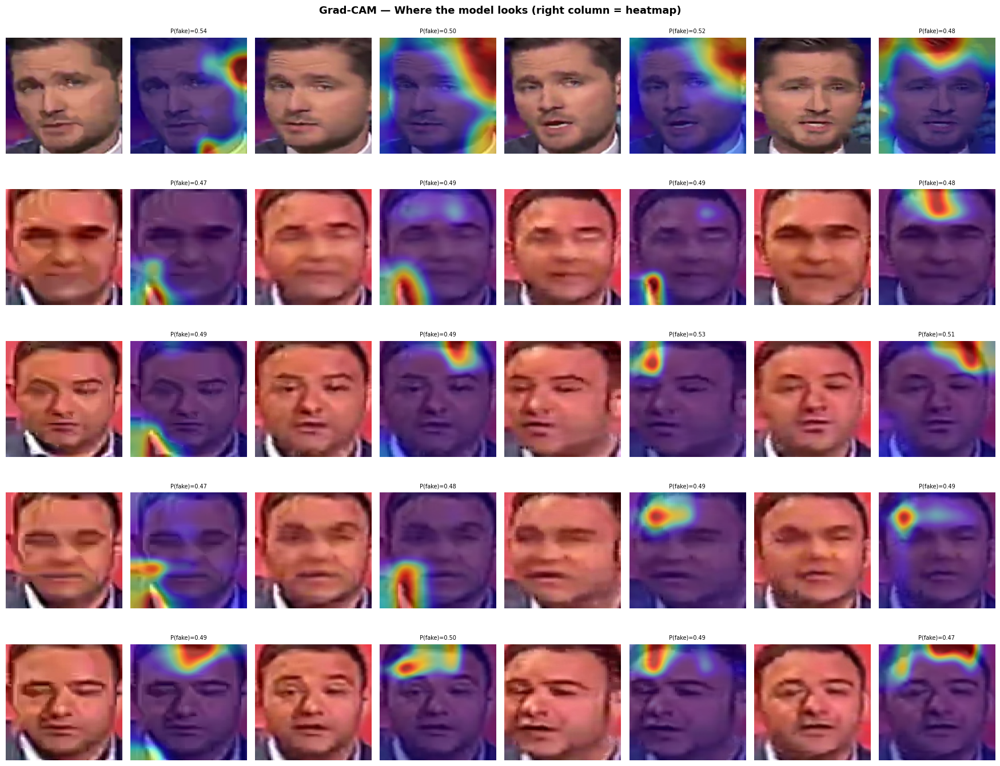

 Grad-CAM grid saved → /content/gradcam_grid.png


In [ ]:
# ── 11.3  Grad-CAM visualisation — real vs fake grid ─────────────────────────
def show_gradcam_grid(faces_dir, fake_methods, model, transform,
                      device, n_per_class=4, face_size=224):
    from pathlib import Path
    classes   = ['real'] + fake_methods
    n_cols    = n_per_class * 2
    fig, axes = plt.subplots(
        len(classes), n_cols,
        figsize=(n_cols * 2.2, len(classes) * 2.8)
    )
    fig.suptitle('Grad-CAM — Where the model looks (right column = heatmap)',
                 fontsize=13, fontweight='bold')

    for row, cls in enumerate(classes):
        imgs = sorted((Path(faces_dir) / cls).rglob('*.jpg'))[:n_per_class]
        for col_pair, img_path in enumerate(imgs):
            img_bgr = cv2.imread(str(img_path))
            if img_bgr is None:
                continue

            cam_img, prob = gradcam_on_image(
                model, img_bgr, transform, device
            )
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

            # Original face
            ax_orig = axes[row][col_pair * 2]
            ax_orig.imshow(img_rgb)
            ax_orig.axis('off')
            if col_pair == 0:
                ax_orig.set_ylabel(cls, fontsize=8, rotation=0,
                                   labelpad=55, va='center')

            # Grad-CAM overlay
            ax_cam = axes[row][col_pair * 2 + 1]
            ax_cam.imshow(cam_img)
            ax_cam.set_title(f'P(fake)={prob:.2f}', fontsize=7)
            ax_cam.axis('off')

    plt.tight_layout()
    plt.savefig('/content/gradcam_grid.png', dpi=130, bbox_inches='tight')
    plt.show()
    print(' Grad-CAM grid saved → /content/gradcam_grid.png')

show_gradcam_grid(
    CFG.FACES_DIR, CFG.FAKE_METHODS,
    baseline_model, baseline_eval_tf, DEVICE, n_per_class=4
)


Grad-CAM per-class confidence:
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
  real                     : mean P(fake) = 0.4816  (n=15)
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise
   Grad

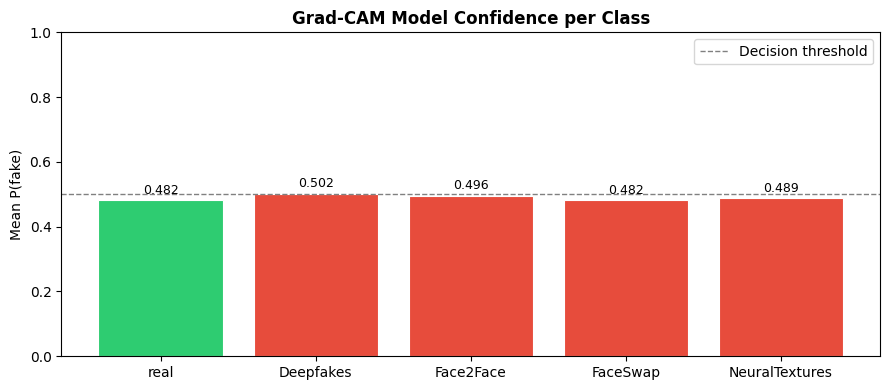

In [ ]:
# ── 11.4  Per-method Grad-CAM confidence comparison ──────────────────────────
from pathlib import Path

def gradcam_confidence_by_method(faces_dir, fake_methods, model,
                                  transform, device, n_samples=20):
    results = {}
    classes = ['real'] + fake_methods
    for cls in classes:
        imgs = sorted((Path(faces_dir) / cls).rglob('*.jpg'))[:n_samples]
        probs = []
        for img_path in imgs:
            img_bgr = cv2.imread(str(img_path))
            if img_bgr is None:
                continue
            _, prob = gradcam_on_image(model, img_bgr, transform, device)
            probs.append(prob)
        results[cls] = probs
        print(f'  {cls:25s}: mean P(fake) = {np.mean(probs):.4f}  (n={len(probs)})')
    return results


print('Grad-CAM per-class confidence:')
gradcam_results = gradcam_confidence_by_method(
    CFG.FACES_DIR, CFG.FAKE_METHODS,
    baseline_model, baseline_eval_tf, DEVICE, n_samples=15
)

# Bar chart
fig, ax = plt.subplots(figsize=(9, 4))
classes = list(gradcam_results.keys())
means   = [np.mean(v) for v in gradcam_results.values()]
colors  = ['#2ecc71'] + ['#e74c3c'] * len(CFG.FAKE_METHODS)

bars = ax.bar(classes, means, color=colors, edgecolor='white', linewidth=0.8)
ax.axhline(0.5, color='gray', linestyle='--', linewidth=1, label='Decision threshold')
ax.set_ylim(0, 1)
ax.set_ylabel('Mean P(fake)')
ax.set_title('Grad-CAM Model Confidence per Class', fontweight='bold')
ax.legend()
for bar, val in zip(bars, means):
    ax.text(bar.get_x() + bar.get_width()/2, val + 0.02,
            f'{val:.3f}', ha='center', fontsize=9)
plt.tight_layout()
plt.savefig('/content/gradcam_confidence.png', dpi=120, bbox_inches='tight')
plt.show()


---
## Phase 10 — Facial Landmark Inconsistency
> MediaPipe Face Mesh extracts 4 geometric features per face.
> Deepfakes often have measurably asymmetric or geometrically inconsistent landmarks.

In [ ]:
# ── 12.1  Install mediapipe ───────────────────────────────────────────────────
!pip install -q mediapipe opencv-python
print('  mediapipe installed.')

  mediapipe installed.


In [ ]:
!wget -q https://storage.googleapis.com/mediapipe-models/face_landmarker/face_landmarker/float16/1/face_landmarker.task

In [ ]:
import cv2
import math
import numpy as np
import mediapipe as mp

from mediapipe.tasks.python import vision
from mediapipe.tasks.python import BaseOptions
from mediapipe.tasks.python.vision import FaceLandmarker, FaceLandmarkerOptions, RunningMode

# Create FaceLandmarker
options = FaceLandmarkerOptions(
    base_options=BaseOptions(model_asset_path='face_landmarker.task'),
    running_mode=RunningMode.IMAGE,
    num_faces=1
)

face_mesh = FaceLandmarker.create_from_options(options)

In [ ]:
LANDMARK_IDX = {
    'left_eye_outer'  : 33,
    'left_eye_inner'  : 133,
    'right_eye_outer' : 362,
    'right_eye_inner' : 263,
    'nose_tip'        : 1,
    'mouth_left'      : 61,
    'mouth_right'     : 291,
    'chin'            : 152,
    'left_eyebrow'    : 70,
    'right_eyebrow'   : 300,
    'jaw_left'        : 234,
    'jaw_right'       : 454,
}

In [ ]:
def extract_landmarks(img_rgb):

    mp_image = mp.Image(
        image_format=mp.ImageFormat.SRGB,
        data=img_rgb
    )

    result = face_mesh.detect(mp_image)

    if not result.face_landmarks:
        return None

    lm = result.face_landmarks[0]

    return {
        name: (lm[idx].x, lm[idx].y)
        for name, idx in LANDMARK_IDX.items()
    }

In [ ]:
def eye_distance_ratio(lm):
    if lm is None:
        return None
    eye_dist = math.dist(lm['left_eye_outer'], lm['right_eye_outer'])
    face_width = math.dist(lm['jaw_left'], lm['jaw_right'])
    return eye_dist / (face_width + 1e-8)


def eye_symmetry_score(lm):
    if lm is None:
        return None
    return abs(lm['left_eye_outer'][1] - lm['right_eye_outer'][1])


def mouth_symmetry_score(lm):
    if lm is None:
        return None
    return abs(lm['mouth_left'][1] - lm['mouth_right'][1])


def jaw_angle(lm):
    if lm is None:
        return None
    jl, ch, jr = lm['jaw_left'], lm['chin'], lm['jaw_right']
    v1 = (jl[0]-ch[0], jl[1]-ch[1])
    v2 = (jr[0]-ch[0], jr[1]-ch[1])
    dot = v1[0]*v2[0] + v1[1]*v2[1]
    mag = (math.hypot(*v1) * math.hypot(*v2)) + 1e-8
    angle = math.degrees(math.acos(max(-1, min(1, dot/mag))))
    return angle

In [ ]:
from pathlib import Path
import pandas as pd
import cv2
import numpy as np

def collect_landmark_features(faces_dir, fake_methods, n_per_class=80):

    records = []
    classes = ['real'] + fake_methods

    for cls in classes:
        imgs = sorted((Path(faces_dir) / cls).rglob('*.jpg'))[:n_per_class]
        print(f'  Processing {cls:25s} ({len(imgs)} images)...')

        for img_path in imgs:
            img_bgr = cv2.imread(str(img_path))
            if img_bgr is None:
                continue

            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
            lm = extract_landmarks(img_rgb)

            if lm is None:
                continue

            records.append({
                'class'          : cls,
                'label'          : 0 if cls == 'real' else 1,
                'eye_dist_ratio' : eye_distance_ratio(lm),
                'eye_symmetry'   : eye_symmetry_score(lm),
                'mouth_symmetry' : mouth_symmetry_score(lm),
                'jaw_angle'      : jaw_angle(lm),
            })

    df = pd.DataFrame(records).dropna()

    print(f'\n Collected {len(df)} landmark records.')
    return df

In [ ]:
landmark_df = collect_landmark_features(
    CFG.FACES_DIR,
    CFG.FAKE_METHODS,
    n_per_class=60
)

print(landmark_df.groupby('class').describe().round(4))

  Processing real                      (60 images)...
  Processing Deepfakes                 (60 images)...
  Processing Face2Face                 (60 images)...
  Processing FaceSwap                  (60 images)...
  Processing NeuralTextures            (60 images)...

 Collected 296 landmark records.
               label                                    eye_dist_ratio  \
               count mean  std  min  25%  50%  75%  max          count   
class                                                                    
Deepfakes       58.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0           58.0   
Face2Face       60.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0           60.0   
FaceSwap        60.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0           60.0   
NeuralTextures  60.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0           60.0   
real            58.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0           58.0   

                        ... mouth_symmetry         jaw_angle                   \
                  mean

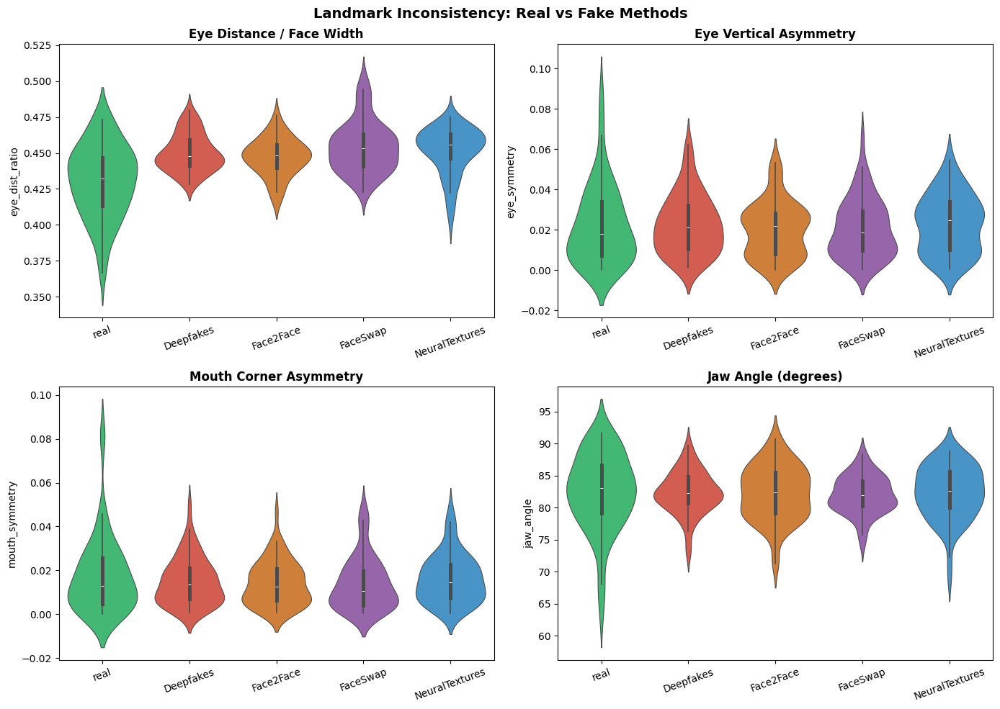

  Landmark distribution plot saved.


In [ ]:
# ── 12.4  Landmark feature distributions — violin + box plots ────────────────
import seaborn as sns

features = ['eye_dist_ratio', 'eye_symmetry', 'mouth_symmetry', 'jaw_angle']
titles   = [
    'Eye Distance / Face Width',
    'Eye Vertical Asymmetry',
    'Mouth Corner Asymmetry',
    'Jaw Angle (degrees)'
]

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Landmark Inconsistency: Real vs Fake Methods',
             fontsize=14, fontweight='bold')

palette = {
    'real'           : '#2ecc71',
    'Deepfakes'      : '#e74c3c',
    'Face2Face'      : '#e67e22',
    'FaceSwap'       : '#9b59b6',
    'NeuralTextures' : '#3498db',
}

for ax, feat, title in zip(axes.flat, features, titles):
    sns.violinplot(
        data=landmark_df, x='class', y=feat,
        palette=palette, inner='box', linewidth=0.8, ax=ax
    )
    ax.set_title(title, fontweight='bold')
    ax.set_xlabel('')
    ax.set_ylabel(feat)
    ax.tick_params(axis='x', rotation=20)

plt.tight_layout()
plt.savefig('/content/landmark_distributions.png', dpi=130, bbox_inches='tight')
plt.show()
print('  Landmark distribution plot saved.')

In [ ]:
from math import pi
import numpy as np
import matplotlib.pyplot as plt

def radar_chart(df, features, palette, title='Landmark Feature Radar'):

    classes = df['class'].unique()
    N = len(features)
    df_norm = df.copy()
    for f in features:
        min_val = df[f].min()
        max_val = df[f].max()
        df_norm[f] = (df[f] - min_val) / (max_val - min_val + 1e-8)

    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(7, 7),
                           subplot_kw=dict(polar=True))

    for cls in classes:
        sub = df_norm[df_norm['class'] == cls][features]

        means = sub.mean().values.tolist()
        means += means[:1]

        ax.plot(angles, means, 'o-', linewidth=2,
                label=cls, color=palette.get(cls, 'gray'))

        ax.fill(angles, means, alpha=0.1,
                color=palette.get(cls, 'gray'))

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(features, size=10)

    ax.set_title(title, size=13, fontweight='bold', pad=20)
    ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=9)

    plt.tight_layout()
    plt.savefig('/content/landmark_radar.png', dpi=130, bbox_inches='tight')
    plt.show()


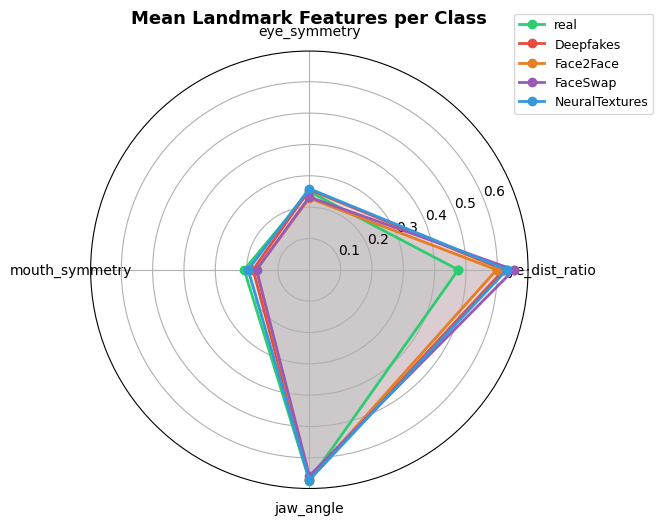

 Radar chart saved.


In [ ]:

radar_chart(landmark_df, features, palette,
            title='Mean Landmark Features per Class')

print(' Radar chart saved.')

In [ ]:
def draw_landmark_overlay(img_rgb, color=(0, 255, 0), r=2):

    h, w = img_rgb.shape[:2]
    mp_image = mp.Image(
        image_format=mp.ImageFormat.SRGB,
        data=img_rgb
    )

    result = face_mesh.detect(mp_image)

    out = img_rgb.copy()

    if result.face_landmarks:
        for lm in result.face_landmarks[0]:
            cx, cy = int(lm.x * w), int(lm.y * h)
            cv2.circle(out, (cx, cy), r, color, -1)

    return out

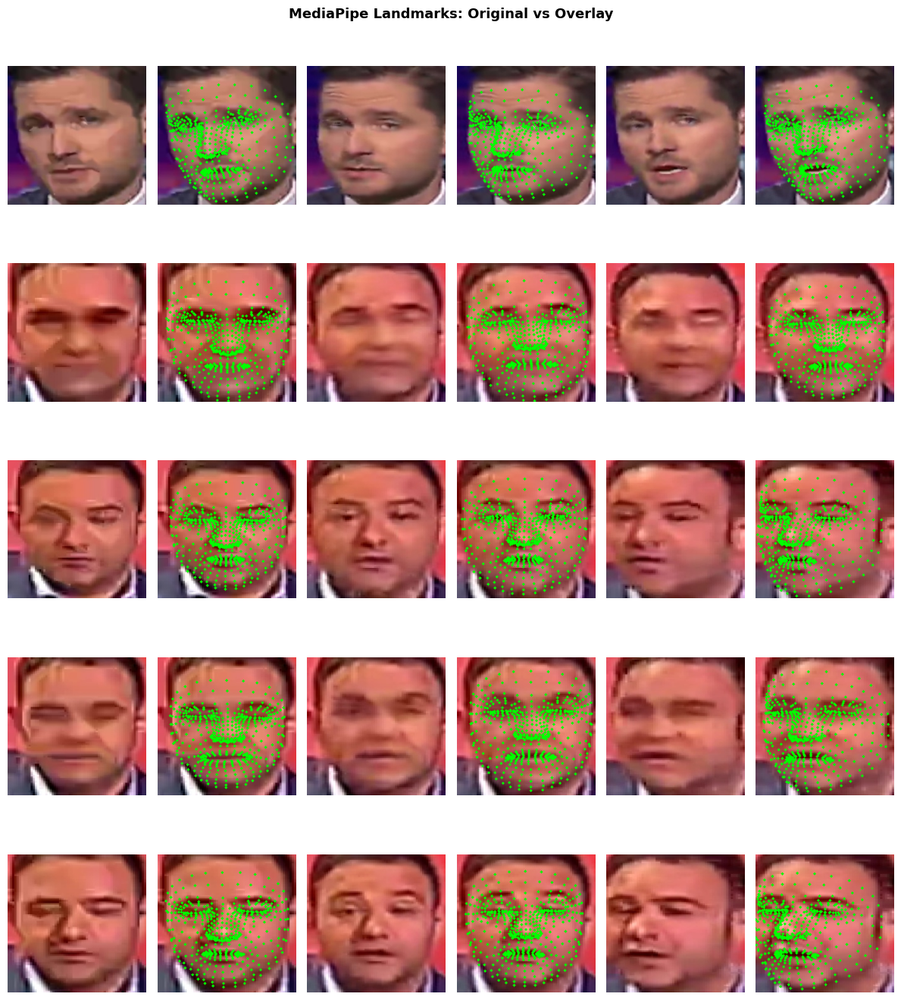

 Landmark overlay grid saved.


In [ ]:
from pathlib import Path
import matplotlib.pyplot as plt
import cv2

classes = ['real'] + CFG.FAKE_METHODS
n_show  = 3

fig, axes = plt.subplots(
    len(classes),
    n_show * 2,
    figsize=(n_show * 4, len(classes) * 2.8)
)

fig.suptitle('MediaPipe Landmarks: Original vs Overlay',
             fontsize=13, fontweight='bold')

for row, cls in enumerate(classes):
    imgs = sorted((Path(CFG.FACES_DIR) / cls).rglob('*.jpg'))[:n_show]

    for col, img_path in enumerate(imgs):
        img_bgr = cv2.imread(str(img_path))

        if img_bgr is None:
            continue

        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        overlay = draw_landmark_overlay(img_rgb)

        ax_orig = axes[row][col * 2]
        ax_lm   = axes[row][col * 2 + 1]

        ax_orig.imshow(img_rgb)
        ax_orig.axis('off')

        ax_lm.imshow(overlay)
        ax_lm.axis('off')

        if col == 0:
            ax_orig.set_ylabel(cls, fontsize=8, rotation=0,
                               labelpad=55, va='center')

plt.tight_layout()
plt.savefig('/content/landmark_overlay.png', dpi=130, bbox_inches='tight')
plt.show()

print(' Landmark overlay grid saved.')

---
## Phase 11 —  Error Level Analysis (ELA)
> Classic JPEG forensics: re-saves image at known compression quality,
> computes pixel-level difference. Manipulated regions show higher error.

In [ ]:
# ── 13.1  ELA core function ───────────────────────────────────────────────────
import io

def compute_ela(img_bgr, quality=90, scale=15):
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    pil_orig = PILImage.fromarray(img_rgb)

    buffer = io.BytesIO()
    pil_orig.save(buffer, format='JPEG', quality=quality)
    buffer.seek(0)
    pil_recompressed = PILImage.open(buffer).convert('RGB')

    orig_arr = np.array(pil_orig,         dtype=np.float32)
    comp_arr = np.array(pil_recompressed, dtype=np.float32)

    diff = np.abs(orig_arr - comp_arr) * scale
    ela_img = np.clip(diff, 0, 255).astype(np.uint8)

    ela_mean = float(diff.mean())
    return ela_img, ela_mean


print('  ELA function defined.')

  ELA function defined.


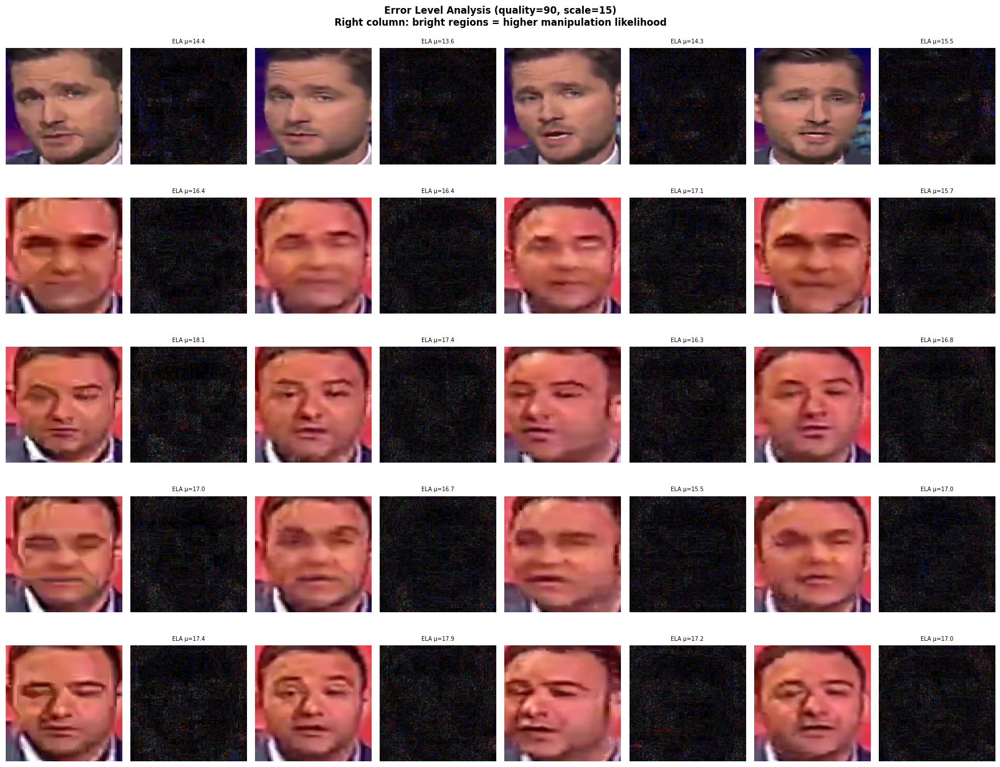

 ELA grid saved → /content/ela_grid.png


In [ ]:
# ── 13.2  ELA visualisation grid ─────────────────────────────────────────────
def show_ela_grid(faces_dir, fake_methods, n_per_class=4, quality=90, scale=15):
    classes   = ['real'] + fake_methods
    n_cols    = n_per_class * 2
    fig, axes = plt.subplots(
        len(classes), n_cols,
        figsize=(n_cols * 2.2, len(classes) * 2.8)
    )
    fig.suptitle(
        f'Error Level Analysis (quality={quality}, scale={scale})\n'
        'Right column: bright regions = higher manipulation likelihood',
        fontsize=12, fontweight='bold'
    )

    for row, cls in enumerate(classes):
        imgs = sorted((Path(faces_dir) / cls).rglob('*.jpg'))[:n_per_class]
        for col_pair, img_path in enumerate(imgs):
            img_bgr = cv2.imread(str(img_path))
            if img_bgr is None:
                continue
            ela_img, ela_mean = compute_ela(img_bgr, quality, scale)
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

            # Original
            ax_o = axes[row][col_pair * 2]
            ax_o.imshow(img_rgb)
            ax_o.axis('off')
            if col_pair == 0:
                ax_o.set_ylabel(cls, fontsize=8, rotation=0,
                                labelpad=55, va='center')

            # ELA map
            ax_e = axes[row][col_pair * 2 + 1]
            ax_e.imshow(ela_img, cmap='hot')
            ax_e.set_title(f'ELA μ={ela_mean:.1f}', fontsize=7)
            ax_e.axis('off')

    plt.tight_layout()
    plt.savefig('/content/ela_grid.png', dpi=130, bbox_inches='tight')
    plt.show()
    print(' ELA grid saved → /content/ela_grid.png')


show_ela_grid(CFG.FACES_DIR, CFG.FAKE_METHODS, n_per_class=4)

In [ ]:
# ── 13.3  ELA mean intensity statistics per class ────────────────────────────
def collect_ela_scores(faces_dir, fake_methods, n_per_class=80,
                       quality=90, scale=15):
    ela_data = {}
    classes  = ['real'] + fake_methods

    for cls in classes:
        imgs  = sorted((Path(faces_dir) / cls).rglob('*.jpg'))[:n_per_class]
        means = []
        for img_path in imgs:
            img_bgr = cv2.imread(str(img_path))
            if img_bgr is None:
                continue
            _, ela_mean = compute_ela(img_bgr, quality, scale)
            means.append(ela_mean)
        ela_data[cls] = means
        print(f'  {cls:25s}: mean ELA = {np.mean(means):.3f} ± {np.std(means):.3f}')

    return ela_data


print('\n ELA scores per class:')
ela_data = collect_ela_scores(CFG.FACES_DIR, CFG.FAKE_METHODS, n_per_class=60)


 ELA scores per class:
  real                     : mean ELA = 14.140 ± 1.706
  Deepfakes                : mean ELA = 14.978 ± 2.015
  Face2Face                : mean ELA = 14.591 ± 1.944
  FaceSwap                 : mean ELA = 14.874 ± 1.897
  NeuralTextures           : mean ELA = 14.493 ± 1.975


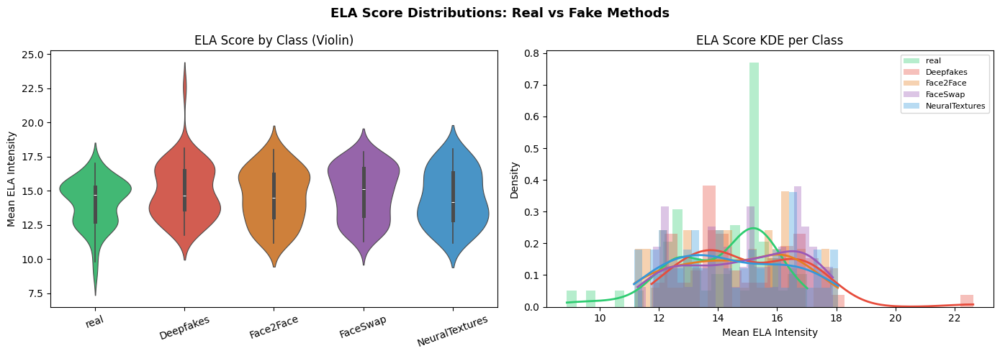

  ELA distribution plots saved.


In [ ]:
# ── 13.4  ELA score distribution plots ───────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('ELA Score Distributions: Real vs Fake Methods',
             fontsize=13, fontweight='bold')

palette_list = ['#2ecc71', '#e74c3c', '#e67e22', '#9b59b6', '#3498db']

# Violin / box
ela_flat   = [(cls, v) for cls, vals in ela_data.items() for v in vals]
ela_plot_df = pd.DataFrame(ela_flat, columns=['class', 'ela_mean'])

sns.violinplot(
    data=ela_plot_df, x='class', y='ela_mean',
    palette={k: c for k, c in zip(ela_data.keys(), palette_list)},
    inner='box', linewidth=0.8, ax=axes[0]
)
axes[0].set_title('ELA Score by Class (Violin)')
axes[0].set_xlabel('')
axes[0].tick_params(axis='x', rotation=20)
axes[0].set_ylabel('Mean ELA Intensity')

# KDE overlay
for cls, color in zip(ela_data.keys(), palette_list):
    vals = np.array(ela_data[cls])
    axes[1].hist(vals, bins=25, density=True, alpha=0.35,
                 color=color, label=cls)
    # smooth KDE line
    from scipy.stats import gaussian_kde
    kde_x = np.linspace(vals.min(), vals.max(), 200)
    kde   = gaussian_kde(vals)
    axes[1].plot(kde_x, kde(kde_x), color=color, linewidth=2)

axes[1].set_title('ELA Score KDE per Class')
axes[1].set_xlabel('Mean ELA Intensity')
axes[1].set_ylabel('Density')
axes[1].legend(fontsize=8)

plt.tight_layout()
plt.savefig('/content/ela_distributions.png', dpi=130, bbox_inches='tight')
plt.show()
print('  ELA distribution plots saved.')

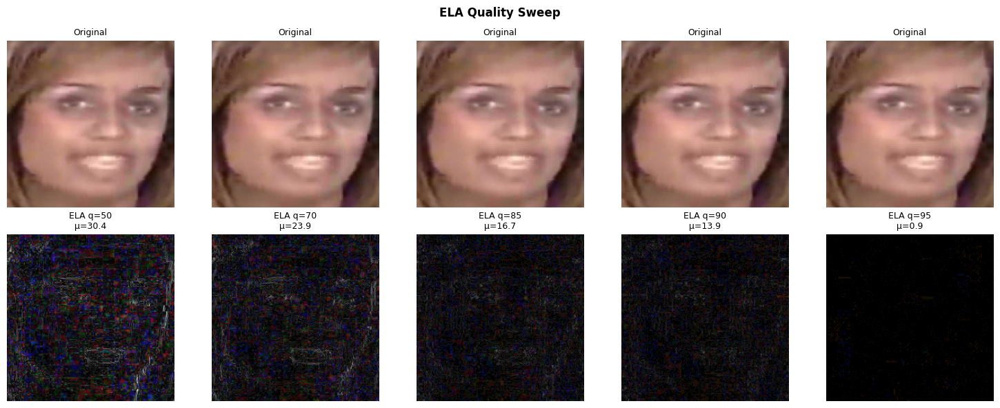

  ELA quality sweep saved.


In [ ]:
# ── 13.5  ELA quality sweep — how sensitivity varies with JPEG quality ────────
def ela_quality_sweep(img_bgr, qualities=None):
    if qualities is None:
        qualities = [50, 70, 85, 90, 95]

    fig, axes = plt.subplots(2, len(qualities), figsize=(len(qualities)*3, 6))
    fig.suptitle('ELA Quality Sweep', fontsize=12, fontweight='bold')

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    for col, q in enumerate(qualities):
        ela_img, ela_mean = compute_ela(img_bgr, quality=q, scale=15)

        axes[0][col].imshow(img_rgb)
        axes[0][col].set_title(f'Original', fontsize=9)
        axes[0][col].axis('off')

        axes[1][col].imshow(ela_img, cmap='hot')
        axes[1][col].set_title(f'ELA q={q}\nμ={ela_mean:.1f}', fontsize=9)
        axes[1][col].axis('off')

    plt.tight_layout()
    plt.savefig('/content/ela_quality_sweep.png', dpi=120, bbox_inches='tight')
    plt.show()

sample_fake = next((Path(CFG.FACES_DIR)/'Deepfakes').rglob('*.jpg'), None)
if sample_fake:
    ela_quality_sweep(cv2.imread(str(sample_fake)))
    print('  ELA quality sweep saved.')

---
## Phase 12 — Master Dashboard: All Techniques Unified
> Brings together every analysis — paper replication, novelty

   Grad-CAM target layer : conv4.pointwise
   Grad-CAM target layer : conv4.pointwise


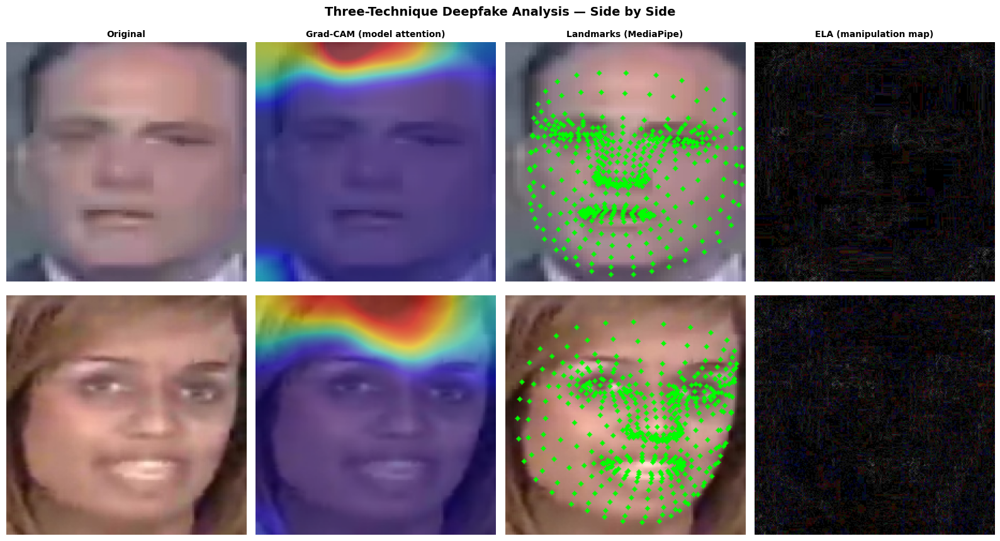

Three-technique comparison saved.


In [ ]:
from pathlib import Path
import matplotlib.pyplot as plt
import cv2

def three_technique_comparison(img_path_real, img_path_fake,
                                model, transform, device):

    col_titles = ['Original', 'Grad-CAM (model attention)',
                  'Landmarks (MediaPipe)', 'ELA (manipulation map)']

    row_labels  = [
        f'REAL - {Path(img_path_real).parent.parent.name}',
        f'FAKE - {Path(img_path_fake).parent.parent.name}'
    ]

    fig, axes = plt.subplots(2, 4, figsize=(16, 9))
    fig.suptitle('Three-Technique Deepfake Analysis — Side by Side',
                 fontsize=14, fontweight='bold')

    for col, ctitle in enumerate(col_titles):
        axes[0][col].set_title(ctitle, fontsize=10, fontweight='bold')

    for row, (img_path, row_label) in enumerate(
            [(img_path_real, row_labels[0]),
             (img_path_fake, row_labels[1])]):

        img_bgr = cv2.imread(str(img_path))

        if img_bgr is None:
            print(f"Could not load image: {img_path}")
            continue

        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # 1. Original
        axes[row][0].imshow(img_rgb)
        axes[row][0].set_ylabel(row_label, fontsize=9, rotation=0,
                                labelpad=65, va='center', fontweight='bold')
        axes[row][0].axis('off')

        # 2. Grad-CAM
        cam_img, prob = gradcam_on_image(model, img_bgr, transform, device)
        axes[row][1].imshow(cam_img)
        axes[row][1].set_xlabel(f'P(fake)={prob:.3f}', fontsize=8)
        axes[row][1].axis('off')

        # 3. Landmark overlay
        lm_overlay = draw_landmark_overlay(img_rgb)
        lm         = extract_landmarks(img_rgb)
        asym       = eye_symmetry_score(lm)

        axes[row][2].imshow(lm_overlay)
        axes[row][2].set_xlabel(
            f'Eye asym={asym:.4f}' if asym is not None else 'No face detected',
            fontsize=8
        )
        axes[row][2].axis('off')

        # 4. ELA
        ela_img, ela_mean = compute_ela(img_bgr, quality=90, scale=15)
        axes[row][3].imshow(ela_img, cmap='hot')
        axes[row][3].set_xlabel(f'ELA mean={ela_mean:.2f}', fontsize=8)
        axes[row][3].axis('off')

    plt.tight_layout()
    plt.savefig('/content/three_technique_comparison.png',
                dpi=140, bbox_inches='tight')
    plt.show()
    print('Three-technique comparison saved.')

real_sample = next((Path(CFG.FACES_DIR) / 'real').rglob('*.jpg'), None)
fake_sample = next((Path(CFG.FACES_DIR) / 'Deepfakes').rglob('*.jpg'), None)

if real_sample and fake_sample:
    three_technique_comparison(
        real_sample, fake_sample,
        baseline_model, baseline_eval_tf, DEVICE
    )
else:
    print("No images found — check CFG.FACES_DIR paths.")
    print(f"  real_sample : {real_sample}")
    print(f"  fake_sample : {fake_sample}")


 Cross-Technique Summary Table:
                GradCAM P(fake)  ELA mean  Eye Asymmetry  Mouth Asymmetry  Jaw Angle
class                                                                               
real                     0.4816    14.140         0.0221           0.0173      82.42
Deepfakes                0.5016    14.978         0.0227           0.0150      82.33
Face2Face                0.4957    14.591         0.0203           0.0141      82.28
FaceSwap                 0.4819    14.874         0.0206           0.0141      82.00
NeuralTextures           0.4887    14.493         0.0230           0.0163      82.36


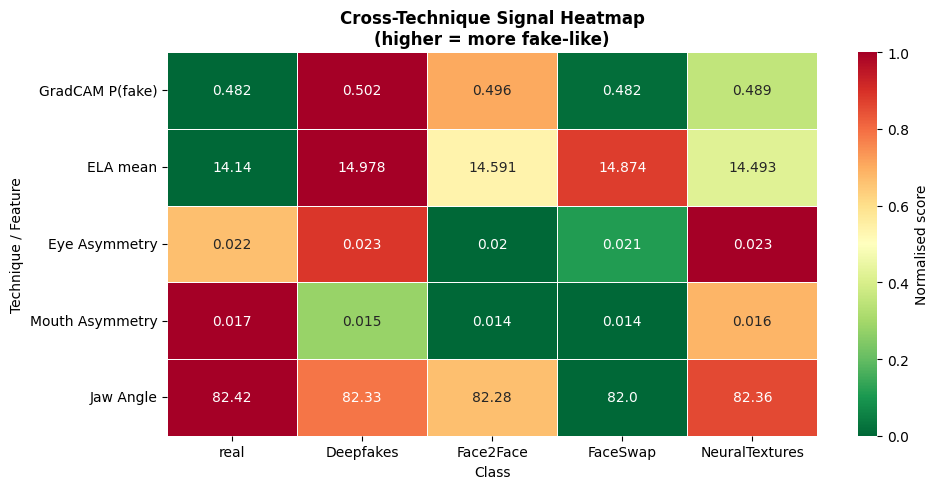

Cross-technique heatmap saved.


In [ ]:
# ── 14.2  Cross-method comparison heatmap ────────────────────────────────────
def build_summary_table(gradcam_results, ela_data, landmark_df):

    rows = []
    classes = list(gradcam_results.keys())
    for cls in classes:
        gc_mean = np.mean(gradcam_results[cls]) if gradcam_results.get(cls) else np.nan
        el_mean = np.mean(ela_data[cls])         if ela_data.get(cls)        else np.nan

        sub = landmark_df[landmark_df['class'] == cls]
        lm_eye   = sub['eye_symmetry'].mean()   if len(sub) else np.nan
        lm_mouth = sub['mouth_symmetry'].mean()  if len(sub) else np.nan
        lm_jaw   = sub['jaw_angle'].mean()       if len(sub) else np.nan

        rows.append({
            'class'          : cls,
            'GradCAM P(fake)': round(gc_mean, 4),
            'ELA mean'       : round(el_mean, 3),
            'Eye Asymmetry'  : round(lm_eye, 4),
            'Mouth Asymmetry': round(lm_mouth, 4),
            'Jaw Angle'      : round(lm_jaw, 2),
        })

    return pd.DataFrame(rows).set_index('class')


summary = build_summary_table(gradcam_results, ela_data, landmark_df)
print('\n Cross-Technique Summary Table:')
print(summary.to_string())

# Normalised heatmap
from sklearn.preprocessing import MinMaxScaler
scaled = pd.DataFrame(
    MinMaxScaler().fit_transform(summary),
    index=summary.index,
    columns=summary.columns
)

fig, ax = plt.subplots(figsize=(10, 5))
sns.heatmap(
    scaled.T, annot=summary.T.round(3), fmt='',
    cmap='RdYlGn_r', linewidths=0.5, linecolor='white',
    ax=ax, cbar_kws={'label': 'Normalised score'}
)
ax.set_title('Cross-Technique Signal Heatmap\n(higher = more fake-like)',
             fontsize=12, fontweight='bold')
ax.set_xlabel('Class')
ax.set_ylabel('Technique / Feature')
plt.tight_layout()
plt.savefig('/content/cross_technique_heatmap.png', dpi=130, bbox_inches='tight')
plt.show()
print('Cross-technique heatmap saved.')

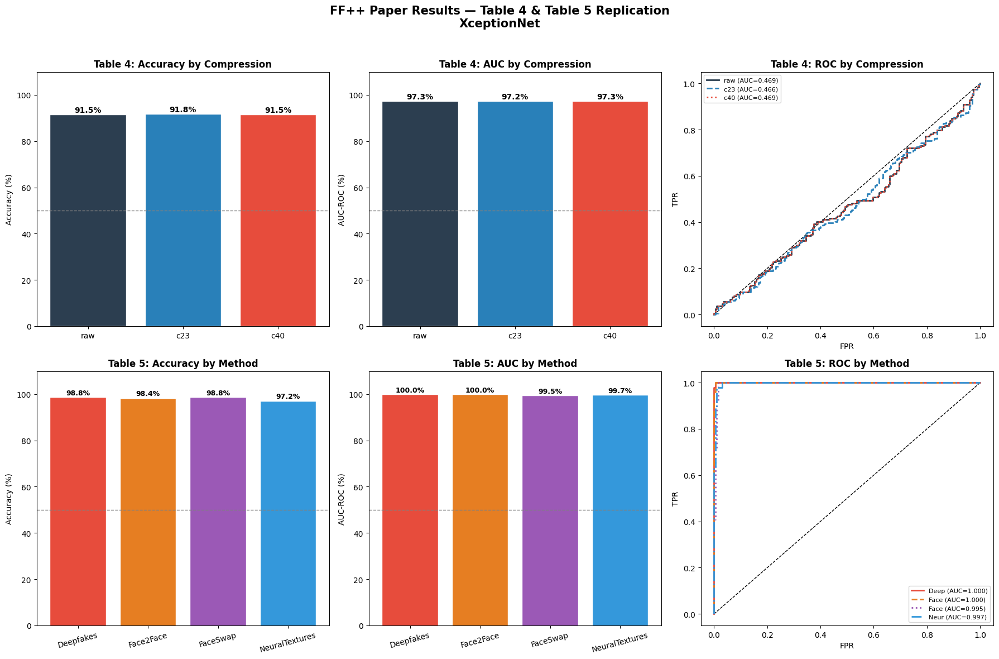

Combined paper results dashboard saved.


In [ ]:
# ── 17.1   ─────────────────────
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc as sklearn_auc

for module in baseline_model.modules():
    module._forward_hooks.clear()
    module._backward_hooks.clear()
    module._forward_pre_hooks.clear()

model          = baseline_model
eval_transform = baseline_eval_tf

# ── Build figure ──────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(18, 12))
fig.suptitle('FF++ Paper Results — Table 4 & Table 5 Replication\nXceptionNet',
             fontsize=15, fontweight='bold', y=0.98)

# ── Row 1: Table 4 (compression) ─────────────────────────────────────────────
ax_c_acc = fig.add_subplot(2, 3, 1)
ax_c_auc = fig.add_subplot(2, 3, 2)
ax_c_roc = fig.add_subplot(2, 3, 3)

comp_colors_list = ['#2c3e50', '#2980b9', '#e74c3c']
x_comp = list(comp_results.keys())
accs_c = [comp_results[c]['Accuracy'] for c in x_comp]
aucs_c = [comp_results[c]['AUC-ROC']  for c in x_comp]

bars = ax_c_acc.bar(x_comp, accs_c, color=comp_colors_list, edgecolor='white')
ax_c_acc.set_ylim(0, 110); ax_c_acc.axhline(50, color='gray', ls='--', lw=1)
ax_c_acc.set_title('Table 4: Accuracy by Compression', fontweight='bold')
ax_c_acc.set_ylabel('Accuracy (%)')
for b, v in zip(bars, accs_c):
    ax_c_acc.text(b.get_x() + b.get_width()/2, v + 1, f'{v:.1f}%',
                  ha='center', fontsize=10, fontweight='bold')

bars2 = ax_c_auc.bar(x_comp, aucs_c, color=comp_colors_list, edgecolor='white')
ax_c_auc.set_ylim(0, 110); ax_c_auc.axhline(50, color='gray', ls='--', lw=1)
ax_c_auc.set_title('Table 4: AUC by Compression', fontweight='bold')
ax_c_auc.set_ylabel('AUC-ROC (%)')
for b, v in zip(bars2, aucs_c):
    ax_c_auc.text(b.get_x() + b.get_width()/2, v + 1, f'{v:.1f}%',
                  ha='center', fontsize=10, fontweight='bold')

# ── ROC curves for Table 4 ────────────────────────────────────────────────────
ax_c_roc.plot([0, 1], [0, 1], 'k--', lw=1)
for target, col, ls in zip(COMPRESSIONS, comp_colors_list, ['-', '--', ':']):
    _, _, _, y_prob_c2, y_true_c2 = evaluate_at_compression(
        model, test_samples, eval_transform, source_comp, target, DEVICE
    )
    if len(set(y_true_c2)) < 2:
        continue
    fpr2, tpr2, _ = roc_curve(y_true_c2, y_prob_c2)
    ax_c_roc.plot(fpr2, tpr2, ls, color=col, lw=2,
                  label=f'{target} (AUC={sklearn_auc(fpr2, tpr2):.3f})')
ax_c_roc.set_title('Table 4: ROC by Compression', fontweight='bold')
ax_c_roc.legend(fontsize=8)
ax_c_roc.set_xlabel('FPR'); ax_c_roc.set_ylabel('TPR')

# ── Row 2: Table 5 (per method) ───────────────────────────────────────────────
ax_m_acc = fig.add_subplot(2, 3, 4)
ax_m_auc = fig.add_subplot(2, 3, 5)
ax_m_roc = fig.add_subplot(2, 3, 6)

methods_list = list(method_results.keys())
m_cols_list  = ['#e74c3c', '#e67e22', '#9b59b6', '#3498db'][:len(methods_list)]
accs_m = [method_results[m]['Accuracy (%)'] for m in methods_list]
aucs_m = [method_results[m]['AUC-ROC (%)']  for m in methods_list]

bars3 = ax_m_acc.bar(methods_list, accs_m, color=m_cols_list, edgecolor='white')
ax_m_acc.set_ylim(0, 110); ax_m_acc.axhline(50, color='gray', ls='--', lw=1)
ax_m_acc.set_title('Table 5: Accuracy by Method', fontweight='bold')
ax_m_acc.set_ylabel('Accuracy (%)')
ax_m_acc.tick_params(axis='x', rotation=15)
for b, v in zip(bars3, accs_m):
    ax_m_acc.text(b.get_x() + b.get_width()/2, v + 1, f'{v:.1f}%',
                  ha='center', fontsize=9, fontweight='bold')

bars4 = ax_m_auc.bar(methods_list, aucs_m, color=m_cols_list, edgecolor='white')
ax_m_auc.set_ylim(0, 110); ax_m_auc.axhline(50, color='gray', ls='--', lw=1)
ax_m_auc.set_title('Table 5: AUC by Method', fontweight='bold')
ax_m_auc.set_ylabel('AUC-ROC (%)')
ax_m_auc.tick_params(axis='x', rotation=15)
for b, v in zip(bars4, aucs_m):
    ax_m_auc.text(b.get_x() + b.get_width()/2, v + 1, f'{v:.1f}%',
                  ha='center', fontsize=9, fontweight='bold')

# ── ROC curves for Table 5 ────────────────────────────────────────────────────
ax_m_roc.plot([0, 1], [0, 1], 'k--', lw=1)
for method, col, ls in zip(methods_list, m_cols_list, ['-', '--', ':', '-.']):
    r2 = method_results[method]
    if len(set(r2['y_true'])) < 2:
        continue
    fpr3, tpr3, _ = roc_curve(r2['y_true'], r2['y_prob'])
    ax_m_roc.plot(fpr3, tpr3, ls, color=col, lw=2,
                  label=f'{method[:4]} (AUC={sklearn_auc(fpr3, tpr3):.3f})')
ax_m_roc.set_title('Table 5: ROC by Method', fontweight='bold')
ax_m_roc.legend(fontsize=8)
ax_m_roc.set_xlabel('FPR'); ax_m_roc.set_ylabel('TPR')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('/content/paper_tables_dashboard.png', dpi=140, bbox_inches='tight')
plt.show()
print('Combined paper results dashboard saved.')